# DengAI Analysis

By: Chengyi (Jeff) Chen, under guidance of CSCI499: AI for Social Good Teaching Assistant - Aaron Ferber

---
## Description

Predicting Dengue based on environment features in San Juan and Iquitos

https://www.drivendata.org/competitions/44/dengai-predicting-disease-spread/

---
## Download Links

Here are the training features and labels given by the competition link.
The training data has 1,456 rows and 24 columns with some nan entries.

- features: https://www.dropbox.com/s/1kuf94b4mk6axyy/dengue_features_train.csv?dl=1
- labels: https://www.dropbox.com/s/626ak8397abonv4/dengue_labels_train.csv?dl=1
- test features: https://s3.amazonaws.com:443/drivendata/data/44/public/dengue_features_test.csv

---
## Objective

- The goal is to predict the `total_cases` label for each `(city, year, weekofyear)` in the test set. There are two cities, San Juan and Iquitos, with test data for each `city` spanning 5 and 3 years respectively. You will make one submission that contains predictions for both cities. The data for each city have been concatenated along with a city column indicating the source: `sj` for San Juan and `iq` for Iquitos. The test set is a pure future hold-out, meaning the test data are sequential and non-overlapping with any of the training data. Throughout, missing values have been filled as `NaN`s.

---
## Content

> ### [Dataset](#data)
> ### [Features](#feats)
> ### [Labels](#labels)
> ### [Vanilla Models](#models)
> ### [Linear Regression Assumptions](#linregassumptions)
1. #### [Linearity between the Exogenous and Endogenous variables](#linearity)
2. #### [Normality of Features {Optional}](#normfeat)
3. #### [Lack of Multicollinearity](#multicol)
4. #### [Homoscedasticity](#homo)
5. #### [Normality of Errors](#normerr)
6. #### [Autocorrelation](#autocorr)
    - ##### [Seasonal Auto-Regressive Integrated Moving Average (SARIMA)](#sarima)
    - ##### [Fast Fourier Transform](#fft)  
>
> ### [Feature Engineering](#feateng)
> ### [Feature Selection](#featselect)
> ### [Decision Trees](#dt)
> ### [Random Forest](#rf)
> ### [AdaBoost](#ada)
> ### [GradientBoosted Trees](#ada)
> ### [Support Vector Regressor](#svr)
> ### [Multi-Layer Perceptron](#mlp)
> ### [Model Performances](#performance)
> ### [Testing Data](#testing)
> ### [Dense Neural Network (Tensorflow)](#dnn)
> ### [Recurrent Neural Networks (Pytorch)](#rnn)
1. #### [Sequence to Sequence](#seq2seq)

<a id="data"></a>

---
## Downloading the Dataset

In [1]:
# Library Imports
import pandas as pd
import numpy as np
import subprocess
import statsmodels.formula.api as sm
from statsmodels import stats as sms
import statsmodels as statsmodels
from scipy import stats
import os
from collections import Counter
from sklearn import model_selection, kernel_ridge, linear_model, metrics, feature_selection, preprocessing
import seaborn as sns
sns.set(style="ticks")

# plotting libraries
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn-paper')
%matplotlib inline

In [2]:
# DengAI dataset URLs
dengai_features_url = 'https://www.dropbox.com/s/1kuf94b4mk6axyy/dengue_features_train.csv'
dengai_labels_url = 'https://www.dropbox.com/s/626ak8397abonv4/dengue_labels_train.csv'
dengai_test_features_url = 'https://s3.amazonaws.com:443/drivendata/data/44/public/dengue_features_test.csv'

In [3]:
# Helper function to create a new folder
def mkdir(path):
    try: 
        os.makedirs(path)
    except OSError:
        if not os.path.isdir(path):
            raise
        else:
            print("(%s) already exists" % (path))

In [4]:
# Directory of dengAI data
DENGAI_PATH = 'data/dengai'

# Remove any old data for dengAI
subprocess.call(['rm', '-rf', DENGAI_PATH])

# Make the directory for the dengAI data
mkdir(DENGAI_PATH + '/features')
mkdir(DENGAI_PATH + '/labels')
mkdir(DENGAI_PATH + '/test_features')

# Download data into data/dengai in the current directory
# run !ls data/dengai to see the csv it downloaded
!wget --directory-prefix=data/dengai/features -Nq https://www.dropbox.com/s/1kuf94b4mk6axyy/dengue_features_train.csv
!wget --directory-prefix=data/dengai/labels -Nq https://www.dropbox.com/s/626ak8397abonv4/dengue_labels_train.csv
!wget --directory-prefix=data/dengai/test_features -Nq https://s3.amazonaws.com:443/drivendata/data/44/public/dengue_features_test.csv

<a id="feats"></a>

---
## Features

In [5]:
raw_features_df = pd.read_csv(DENGAI_PATH + '/features/dengue_features_train.csv', index_col='week_start_date')

In [6]:
raw_features_df.head(10)

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,sj,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1990-05-07,sj,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
1990-05-14,sj,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
1990-05-21,sj,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
1990-05-28,sj,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8
1990-06-04,sj,1990,23,NaN,0.174850,0.254314,0.181743,9.58,299.630000,299.764286,...,26.49,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1
1990-06-11,sj,1990,24,0.112900,0.092800,0.205071,0.210271,3.48,299.207143,299.221429,...,38.60,82.000000,3.48,17.234286,2.042857,27.414286,6.771429,32.2,23.3,29.7
1990-06-18,sj,1990,25,0.072500,0.072500,0.151471,0.133029,151.12,299.591429,299.528571,...,30.00,83.375714,151.12,17.977143,1.571429,28.371429,7.685714,33.9,22.8,21.1
1990-06-25,sj,1990,26,0.102450,0.146175,0.125571,0.123600,19.32,299.578571,299.557143,...,37.51,82.768571,19.32,17.790000,1.885714,28.328571,7.385714,33.9,22.8,21.1


In [7]:
raw_features_df.columns

Index(['city', 'year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm'],
      dtype='object')

In [8]:
raw_features_df.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,1456.000000,1456.000000,1262.000000,1404.000000,1434.000000,1434.000000,1443.000000,1446.000000,1446.000000,1446.000000,...,1446.000000,1446.000000,1443.000000,1446.000000,1446.000000,1413.000000,1413.000000,1436.000000,1442.000000,1434.000000
mean,2001.031593,26.503434,0.142294,0.130553,0.203783,0.202305,45.760388,298.701852,299.225578,295.246356,...,40.151819,82.161959,45.760388,16.746427,4.903754,27.185783,8.059328,32.452437,22.102150,39.326360
std,5.408314,15.019437,0.140531,0.119999,0.073860,0.083903,43.715537,1.362420,1.261715,1.527810,...,43.434399,7.153897,43.715537,1.542494,3.546445,1.292347,2.128568,1.959318,1.574066,47.455314
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,294.635714,294.892857,289.642857,...,0.000000,57.787143,0.000000,11.715714,1.357143,21.400000,4.528571,26.700000,14.700000,0.000000
25%,1997.000000,13.750000,0.044950,0.049217,0.155087,0.144209,9.800000,297.658929,298.257143,294.118929,...,13.055000,77.177143,9.800000,15.557143,2.328571,26.300000,6.514286,31.100000,21.100000,8.700000
50%,2002.000000,26.500000,0.128817,0.121429,0.196050,0.189450,38.340000,298.646429,299.289286,295.640714,...,27.245000,80.301429,38.340000,17.087143,2.857143,27.414286,7.300000,32.800000,22.200000,23.850000
75%,2005.000000,39.250000,0.248483,0.216600,0.248846,0.246982,70.235000,299.833571,300.207143,296.460000,...,52.200000,86.357857,70.235000,17.978214,7.625000,28.157143,9.566667,33.900000,23.300000,53.900000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,390.600000,302.200000,302.928571,298.450000,...,570.500000,98.610000,390.600000,20.461429,16.028571,30.800000,15.800000,42.200000,25.600000,543.300000


__Eliminate Features with > 25% missing data__

In [9]:
# 25% is arbitrary, you can use diff cut offs in cross validation step
bad_col_inds = (raw_features_df.isna().sum() / raw_features_df.shape[0]) > 0.25
raw_features_df = raw_features_df[raw_features_df.columns[~bad_col_inds]]
bad_col_inds

city                                     False
year                                     False
weekofyear                               False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_temp_c                       False
station_min_t

__Seems like there aren't any features with >25% missing observations__

__Replace missing values with most frequent value__

In [10]:
# Which columns are the ones with NaN
raw_features_df.isna().any()

city                                     False
year                                     False
weekofyear                               False
ndvi_ne                                   True
ndvi_nw                                   True
ndvi_se                                   True
ndvi_sw                                   True
precipitation_amt_mm                      True
reanalysis_air_temp_k                     True
reanalysis_avg_temp_k                     True
reanalysis_dew_point_temp_k               True
reanalysis_max_air_temp_k                 True
reanalysis_min_air_temp_k                 True
reanalysis_precip_amt_kg_per_m2           True
reanalysis_relative_humidity_percent      True
reanalysis_sat_precip_amt_mm              True
reanalysis_specific_humidity_g_per_kg     True
reanalysis_tdtr_k                         True
station_avg_temp_c                        True
station_diur_temp_rng_c                   True
station_max_temp_c                        True
station_min_t

In [11]:
# Taking care of missing data
from sklearn.preprocessing import Imputer
imputer = Imputer(missing_values = 'NaN', strategy = 'most_frequent')
imputer = imputer.fit(raw_features_df.loc[:, raw_features_df.isna().any()])
raw_features_df.loc[:, raw_features_df.isna().any()] = imputer.transform(raw_features_df.loc[:, raw_features_df.isna().any()])

/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


In [12]:
# Check if imputer is successful
raw_features_df.isna().any()

city                                     False
year                                     False
weekofyear                               False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_temp_c                       False
station_min_t

In [13]:
# Check the datatypes of the feature columns
raw_features_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1456 entries, 1990-04-30 to 2010-06-25
Data columns (total 23 columns):
city                                     1456 non-null object
year                                     1456 non-null int64
weekofyear                               1456 non-null int64
ndvi_ne                                  1456 non-null float64
ndvi_nw                                  1456 non-null float64
ndvi_se                                  1456 non-null float64
ndvi_sw                                  1456 non-null float64
precipitation_amt_mm                     1456 non-null float64
reanalysis_air_temp_k                    1456 non-null float64
reanalysis_avg_temp_k                    1456 non-null float64
reanalysis_dew_point_temp_k              1456 non-null float64
reanalysis_max_air_temp_k                1456 non-null float64
reanalysis_min_air_temp_k                1456 non-null float64
reanalysis_precip_amt_kg_per_m2          1456 non-null float64
reanal

In [14]:
raw_features_df.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,sj,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1990-05-07,sj,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
1990-05-14,sj,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
1990-05-21,sj,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
1990-05-28,sj,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


__Let's remove the time-related variables like `year`, `weekofyear`, `week_start_date` from the dataset and store the rest as our input variables for our model, but let's save the `week_start_date` as a variable so that we can use it for vizualizing our dengue cases throughout the years later__

In [15]:
# The two cities in our dataset
raw_features_df['city'].unique()

array(['sj', 'iq'], dtype=object)

__Let's keep a dataframe with both cities' data and another two dataframes for each city's data separately so that we are building 3 models for each machine learning technique we use, 1. Both cities, 2. Only City sj, 3. Only City iq__

In [16]:
features_df = raw_features_df.drop(['year', 'weekofyear'], axis=1)
all_X = features_df.copy()
all_X.head()

,city,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,sj,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1990-05-07,sj,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
1990-05-14,sj,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
1990-05-21,sj,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
1990-05-28,sj,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


__Let's perform One-hot encoding on the City feature of all_X__

In [17]:
# Encoding categorical data
# Encoding the Independent Variable
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Encode countries as numbers
all_X['city'] = LabelEncoder().fit_transform(all_X['city'])
all_X.head()

,city,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,1,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1990-05-07,1,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
1990-05-14,1,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
1990-05-21,1,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
1990-05-28,1,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [18]:
from sklearn.compose import ColumnTransformer

# Split up each country to its own column, and 
# cell has value of 1 if the row contained the 
# country and 0 if not
all_X = pd.DataFrame(OneHotEncoder(categorical_features=[0]).fit_transform(all_X).toarray(), 
                     index=all_X.index, 
                     columns=['city_iq', 'city_sj'] + [feat for feat in all_X.columns[1:].values])
all_X.head()

/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:368: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:390: DeprecationWarning: The 'categorical_features' keyword is deprecated in version 0.20 and will be removed in 0.22. You can use the ColumnTransformer instead.
  "use the ColumnTransformer instead.", DeprecationWarning)


,city_iq,city_sj,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,0.0,1.0,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1990-05-07,0.0,1.0,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
1990-05-14,0.0,1.0,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
1990-05-21,0.0,1.0,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
1990-05-28,0.0,1.0,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [19]:
# Let's split our data to one for city sj and one for city iq
sj_X = features_df[features_df['city'] == 'sj'].drop(['city'], axis=1)
sj_X.index = pd.to_datetime(sj_X.index)
sj_X.head()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
week_start_date,,,,,,,,,,,,,,,,,,,,
1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [20]:
iq_X = features_df[features_df['city'] == 'iq'].drop(['city'], axis=1)
iq_X.index = pd.to_datetime(iq_X.index)
iq_X.head()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
week_start_date,,,,,,,,,,,,,,,,,,,,
2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,298.450000,295.184286,307.3,293.1,43.19,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0
2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,298.428571,295.358571,306.6,291.1,46.00,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6
2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,297.392857,295.622857,304.5,292.6,64.77,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1
2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,296.228571,292.797143,303.6,288.6,23.96,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0
2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,297.635714,293.957143,307.0,291.5,31.80,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0


<a id="labels"></a>

---
## Labels

In [21]:
raw_labels_df = pd.read_csv(DENGAI_PATH + '/labels/dengue_labels_train.csv')

In [22]:
raw_labels_df.head(10)

,city,year,weekofyear,total_cases
0,sj,1990,18,4
1,sj,1990,19,5
2,sj,1990,20,4
3,sj,1990,21,3
4,sj,1990,22,6
5,sj,1990,23,2
6,sj,1990,24,4
7,sj,1990,25,5
8,sj,1990,26,10
9,sj,1990,27,6


In [23]:
# The total dengue cases for both cities
all_y = raw_labels_df['total_cases']
all_y.index = all_X.index

# The total dengue cases for City sj
sj_y = raw_labels_df[raw_labels_df['city'] == 'sj']['total_cases']
sj_y.index = sj_X.index

# The total dengue cases for city iq
iq_y = raw_labels_df[raw_labels_df['city'] == 'iq']['total_cases']
iq_y.index = iq_X.index

### Visualize target distribution
__Let's first start to visualize the frequency of the dengue cases against the time__

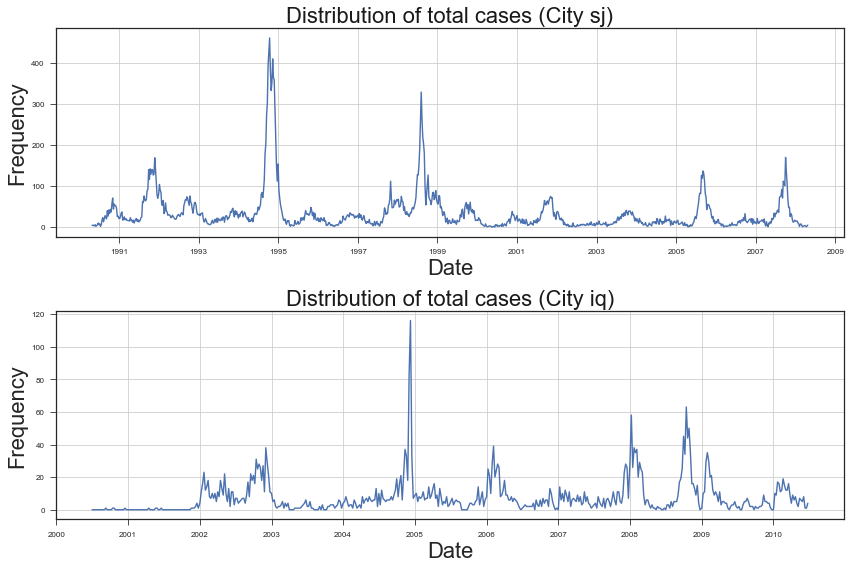

In [24]:
# Output Images Settings
from pylab import rcParams
rcParams['figure.figsize'] = 12, 8
fig, ax = plt.subplots(2,1)

ax[0].plot(sj_X.index, sj_y)
ax[0].grid(True)
ax[0].set_title("Distribution of total cases (City sj)", fontsize=22, color='k')
ax[0].set_ylabel("Frequency", fontsize=22)
ax[0].set_xlabel("Date", fontsize=22)

ax[1].plot(iq_X.index, iq_y)
ax[1].grid(True)
ax[1].set_title("Distribution of total cases (City iq)", fontsize=22, color='k')
ax[1].set_ylabel("Frequency", fontsize=22)
ax[1].set_xlabel("Date", fontsize=22)

plt.tight_layout()
plt.show();

__Seems like Dengue cases spiked in the second half of 1994, second half of 1998, second half of 2005, second half of 2007 for City sj and spiked in the second half of 2004, start of 2008, and second half of 2008 for City iq. However, there is some seasonal pattern to the data, which is logical given that dengue mosquitos breed more often in certain climates (hot and humid), so maybe a Seasonal Arima later on would reveal more information about the underlying trend.__

__Let's take a look at their respective histograms__

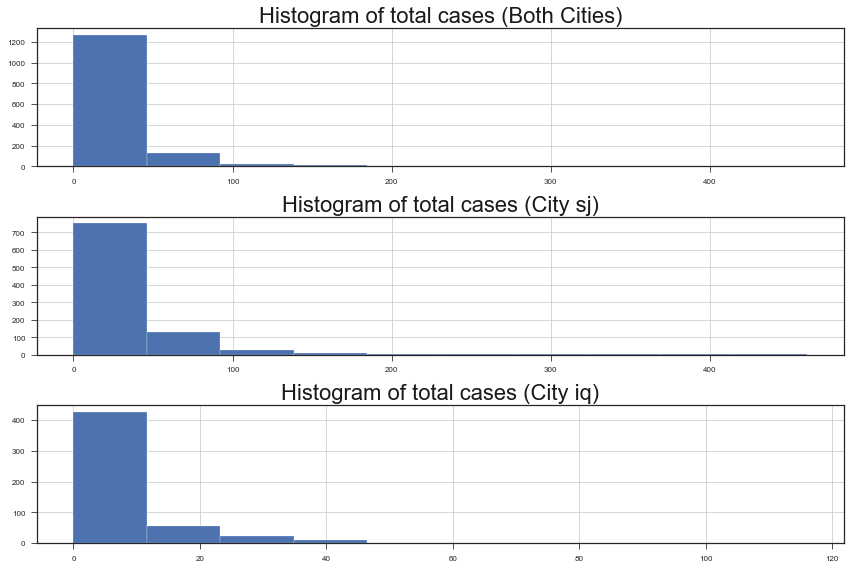

In [25]:
rcParams['figure.figsize'] = 12, 8
fig, ax = plt.subplots(3,1)

ax[0].hist(all_y)
ax[0].grid(True)
ax[0].set_title("Histogram of total cases (Both Cities)", fontsize=22, color='k')

ax[1].hist(sj_y)
ax[1].grid(True)
ax[1].set_title("Histogram of total cases (City sj)", fontsize=22, color='k')

ax[2].hist(iq_y)
ax[2].grid(True)
ax[2].set_title("Histogram of total cases (City iq)", fontsize=22, color='k')

plt.tight_layout()
plt.show();

__It appears that the label data for both cities are heavily skewed to the right, we can either do a log transform to correct the skewness, but let's do a Yeo Johnson Transform on the labels to make them normally distributed instead.__

In [26]:
from sklearn.preprocessing import PowerTransformer

# Applying yeo-johnson transform on the labels of both cities
# REMEMBER TO INVERSE TRANSFORM YOUR Y_PREDS
all_pwr = PowerTransformer()
all_y = pd.Series(all_pwr.fit_transform(all_y.values[:, None]).flatten(), index=all_y.index)

# Applying yeo-johnson transform on the labels of City sj 
# REMEMBER TO INVERSE TRANSFORM YOUR Y_PREDS
sj_pwr = PowerTransformer()
sj_y = pd.Series(sj_pwr.fit_transform(sj_y.values[:, None]).flatten(), index=sj_y.index)

# Applying yeo-johnson transform on the labels of City iq 
# REMEMBER TO INVERSE TRANSFORM YOUR Y_PREDS
iq_pwr = PowerTransformer()
iq_y = pd.Series(iq_pwr.fit_transform(iq_y.values[:, None]).flatten(), index=iq_y.index)

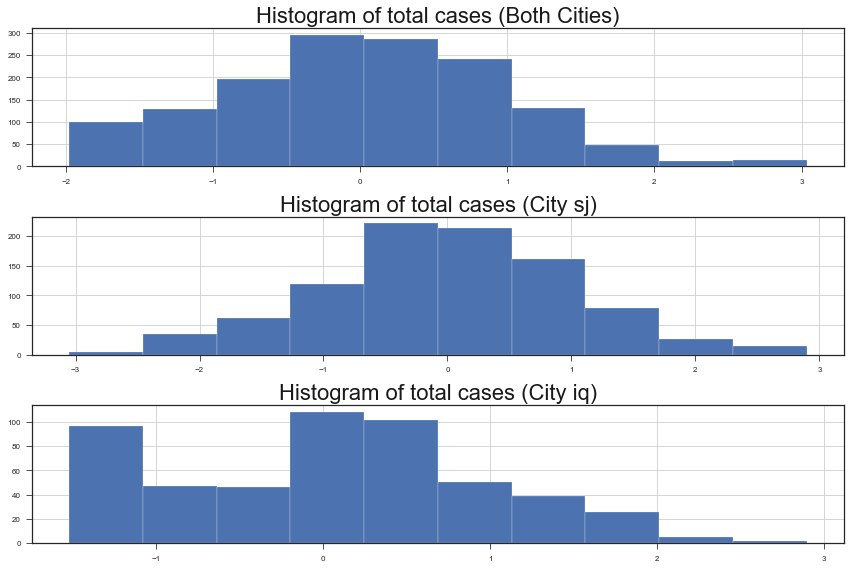

In [27]:
rcParams['figure.figsize'] = 12, 8
fig, ax = plt.subplots(3,1)

ax[0].hist(all_y)
ax[0].grid(True)
ax[0].set_title("Histogram of total cases (Both Cities)", fontsize=22, color='k')

ax[1].hist(sj_y)
ax[1].grid(True)
ax[1].set_title("Histogram of total cases (City sj)", fontsize=22, color='k')

ax[2].hist(iq_y)
ax[2].grid(True)
ax[2].set_title("Histogram of total cases (City iq)", fontsize=22, color='k')

plt.tight_layout()
plt.show();

<a id="models"></a>

---
## Brute-Force Plug and Chug Models

__Let's just try out a few vanilla regression models on the dataset to see what accuracy we can get__

__Train Test Split__

In [28]:
from sklearn.model_selection import train_test_split

In [29]:
# Train test split for Both Cities data
all_X_train, all_X_test, all_y_train, all_y_test = train_test_split(all_X, all_y, test_size=0.33, random_state=42)

# Inverse Transform all_y test 
all_y_test = all_pwr.inverse_transform(all_y_test[:,None])

# Train test split for City sj data
sj_X_train, sj_X_test, sj_y_train, sj_y_test = train_test_split(sj_X, sj_y, test_size=0.33, random_state=42)

# Inverse Transform sj_y test 
sj_y_test = sj_pwr.inverse_transform(sj_y_test[:,None])

# Train test split for City iq data
iq_X_train, iq_X_test, iq_y_train, iq_y_test = train_test_split(iq_X, iq_y, test_size=0.33, random_state=42)

# Inverse Transform iq_y test 
iq_y_test = iq_pwr.inverse_transform(iq_y_test[:,None])

__Let's fit the data to a 1. Decision Tree, 2. Random Forest, 3. AdaBoost, 4. Linear Regression, and 5. Support Vector Regressor model for now__

In [30]:
# Import models from sklearn
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

__Initiating Models__

In [31]:
# Initiate instance of each Model for Both Cities data
all_tree_mod = DecisionTreeRegressor()
all_rf_mod = RandomForestRegressor()
all_ada_mod = AdaBoostRegressor()
all_reg_mod = LinearRegression()
all_svr_mod = SVR()

all_mods = {
    'DecisionTreeRegressor' : all_tree_mod,
    'RandomForestRegressor' : all_rf_mod,
    'AdaBoostRegressor' : all_ada_mod,
    'LinearRegression' : all_reg_mod,
    'SVR' : all_svr_mod
}

# Initiate instance of each Model for City sj data
sj_tree_mod = DecisionTreeRegressor()
sj_rf_mod = RandomForestRegressor()
sj_ada_mod = AdaBoostRegressor()
sj_reg_mod = LinearRegression()
sj_svr_mod = SVR()

sj_mods = {
    'DecisionTreeRegressor' : sj_tree_mod,
    'RandomForestRegressor' : sj_rf_mod,
    'AdaBoostRegressor' : sj_ada_mod,
    'LinearRegression' : sj_reg_mod,
    'SVR' : sj_svr_mod
}

# Initiate instance of each Model for City iq data
iq_tree_mod = DecisionTreeRegressor()
iq_rf_mod = RandomForestRegressor()
iq_ada_mod = AdaBoostRegressor()
iq_reg_mod = LinearRegression()
iq_svr_mod = SVR()

iq_mods = {
    'DecisionTreeRegressor' : iq_tree_mod,
    'RandomForestRegressor' : iq_rf_mod,
    'AdaBoostRegressor' : iq_ada_mod,
    'LinearRegression' : iq_reg_mod,
    'SVR' : iq_svr_mod
}

__Training: Fitting the Models__

In [32]:
# Fit each of your models using the training data of Both Cities
for name, mod in all_mods.items():
    mod.fit(all_X_train, all_y_train)

# Fit each of your models using the training data of City sj
for name, mod in sj_mods.items():
    mod.fit(sj_X_train, sj_y_train)

# Fit each of your models using the training data of City iq
for name, mod in iq_mods.items():
    mod.fit(iq_X_train, iq_y_train)

/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.2

__Testing: Predicting y_test values__

In [33]:
# Predict y_pred using Both Cities models
all_y_preds = {}
for name, mod in all_mods.items():
    all_y_preds['{}_y_pred'.format(name)] = all_pwr.inverse_transform(mod.predict(all_X_test)[:,None])

# Predict y_pred using City sj models
sj_y_preds = {}
for name, mod in sj_mods.items():
    sj_y_preds['{}_y_pred'.format(name)] = sj_pwr.inverse_transform(mod.predict(sj_X_test)[:,None])

# Predict y_pred using City iq models
iq_y_preds = {}
for name, mod in iq_mods.items():
    iq_y_preds['{}_y_pred'.format(name)] = iq_pwr.inverse_transform(mod.predict(iq_X_test)[:,None])

__Metrics for Regression__

In [34]:
# Import the metrics from sklearn
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [35]:
# Helper function to print regression
# scores
def print_reg_scores(y_preds, y_test, city):
    print('{} City Model Prediction Metrics:'.format(city))
    print('\nR^2 Scores:')
    for name, y_pred in y_preds.items():
        print('{}: '.format(name[:-7] + ' Model') + str(r2_score(y_test, y_pred)))

    print('\nMSE Scores:')
    for name, y_pred in y_preds.items():
        print('{}: '.format(name[:-7] + ' Model') + str(mean_squared_error(y_test, y_pred)))    

    print('\nMAE Scores:')
    for name, y_pred in y_preds.items():
        print('{}: '.format(name[:-7] + ' Model') + str(mean_absolute_error(y_test, y_pred)))

# Print the R^2, MSE, and MAE scores for Both Cities model predictions
print_reg_scores(all_y_preds, all_y_test, city='all')

all City Model Prediction Metrics:

R^2 Scores:
DecisionTreeRegressor Model: 0.22628989014433876
RandomForestRegressor Model: 0.18727405158543453
AdaBoostRegressor Model: 0.1449222335548691
LinearRegression Model: 0.04903382213074281
SVR Model: -0.09431499414200051

MSE Scores:
DecisionTreeRegressor Model: 1810.7767732217344
RandomForestRegressor Model: 1902.0887172564485
AdaBoostRegressor Model: 2001.2081256971217
LinearRegression Model: 2225.6235831354757
SVR Model: 2561.1144907364346

MAE Scores:
DecisionTreeRegressor Model: 22.275427135674686
RandomForestRegressor Model: 19.009493214924564
AdaBoostRegressor Model: 19.269009399052
LinearRegression Model: 19.38072499563855
SVR Model: 21.930164533250913


In [36]:
# Print the R^2, MSE, and MAE scores for City sj model predictions
print_reg_scores(sj_y_preds, sj_y_test, city='sj')

sj City Model Prediction Metrics:

R^2 Scores:
DecisionTreeRegressor Model: -0.1708647009704385
RandomForestRegressor Model: -0.017144048416125823
AdaBoostRegressor Model: 0.005706619244675415
LinearRegression Model: -0.035609528359441533
SVR Model: -0.09205272615269111

MSE Scores:
DecisionTreeRegressor Model: 3243.8899676375436
RandomForestRegressor Model: 2818.0056769707085
AdaBoostRegressor Model: 2754.6977204516875
LinearRegression Model: 2869.1644360366254
SVR Model: 3025.5407644981037

MAE Scores:
DecisionTreeRegressor Model: 32.880258899676384
RandomForestRegressor Model: 25.477522681658847
AdaBoostRegressor Model: 24.738723865169693
LinearRegression Model: 24.501990920571114
SVR Model: 25.958118022413732


In [37]:
# Print the R^2, MSE, and MAE scores for City iq model predictions
print_reg_scores(iq_y_preds, iq_y_test, city='iq')

iq City Model Prediction Metrics:

R^2 Scores:
DecisionTreeRegressor Model: -1.8863425401543767
RandomForestRegressor Model: -0.07897979031956659
AdaBoostRegressor Model: -0.08009211178312547
LinearRegression Model: -0.06593342265841495
SVR Model: -0.1145983902039116

MSE Scores:
DecisionTreeRegressor Model: 282.5290697674418
RandomForestRegressor Model: 105.61572378050178
AdaBoostRegressor Model: 105.72460314738554
LinearRegression Model: 104.33868265739515
SVR Model: 109.10224339892673

MAE Scores:
DecisionTreeRegressor Model: 9.540697674418603
RandomForestRegressor Model: 6.178083211645733
AdaBoostRegressor Model: 5.9145773201175835
LinearRegression Model: 6.040398333542399
SVR Model: 5.920600256979818


__All the scores are really bad, but that's to be expected because we haven't performed any feature engineering as well as standardizing the features and handling some of the assumptions of the models used, like normality of residuals in Linear Regression, Lack of multicollinearity... that'll be our next step. Also, it might just be better for us to train 2 separate models on City sj and iq.__

<a id="linregassumptions"></a>

---
## Linear Regression Model Assumptions

__*According to the Gauss-Markov theorem, the Ordinary Least Squares method in Classical Linear Regression gives the best estimator of best fit, but has quite a number of assumptions, let's address them first to see if it is still an appropriate model and what we can do to make it appropriate*__

We have:
1. The model parameters are linear, meaning the regression coefficients don’t enter the function being estimated as exponents (although the variables can have exponents).

2. The values for the independent variables are derived from a random sample of the population, and they contain variability.

3. The explanatory variables don’t have perfect collinearity (that is, no independent variable can be expressed as a linear function of any other independent variables).

4. The error term has zero conditional mean, meaning that the average error is zero at any specific value of the independent variable(s).

5. The model has no heteroskedasticity (meaning the variance of the error is the same regardless of the independent variable’s value).

6. The model has no autocorrelation (the error term doesn’t exhibit a systematic relationship over time).

__In our analysis, we will address the following key assumptions:__
- [Linearity between the Exogenous and Endogenous variables](#linearity)
- [Normality of Features {Optional}](#normfeat)
- [Lack of Multicollinearity](#multicol)
- [Homoscedasticity](#homo)
- [Normality of Errors](#normerr)
- [Autocorrelation](#autocorr)

__After addressing each of the assumptions above, we will perform feature engineering and feature selection to improve our linear regression model as well as subsequent models__
- [Feature Engineering](#feateng) (#TODO)
- [Feature Selection](#featselect) (#TODO)

---
<a id="linearity"></a>

## 1. Linearity between each of the Independent Variables and the Dependent Variable

- Plotting the Dependent Variable against each of the Indepent Variables

In [41]:
# Helper function to plot scatter plots of 
# independent vars against dependent var
def plot_scatter_feats(X, y):
    rcParams['figure.figsize'] = 20, 60
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            ax[idx, 0].scatter(X[name], y, alpha=0.5)
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Number of Cases against {}".format(name), color='k')
            ax[idx, 0].set_ylabel("Frequency")
            ax[idx, 0].set_xlabel("{}".format(name))
        else:
            ax[idx - (len(X.columns) // 2), 1].scatter(X[name], y, alpha=0.5)
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Number of Cases against {}".format(name), color='k')
            ax[idx - (len(X.columns) // 2), 1].set_ylabel("Frequency")
            ax[idx - (len(X.columns) // 2), 1].set_xlabel("{}".format(name))

    plt.tight_layout()
    plt.show();

#### City sj:
- __Let's plot the dependent var (Number of Dengue Cases) against each of the independent vars (features)__

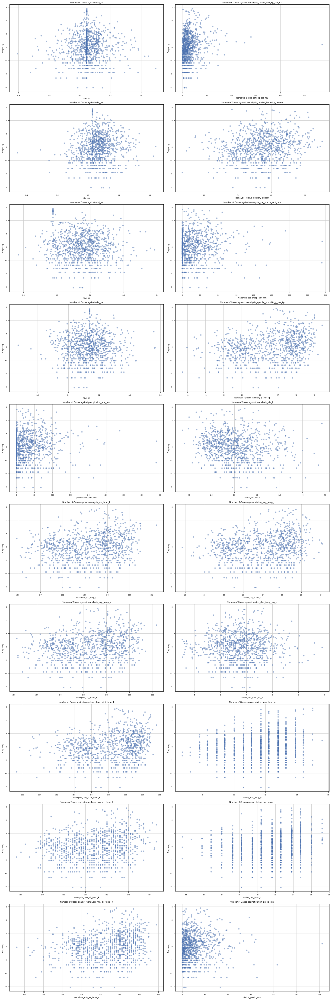

In [42]:
plot_scatter_feats(sj_X, sj_y)

#### City iq:
- __Let's plot the dependent var (Number of Dengue Cases) against each of the independent vars (features)__

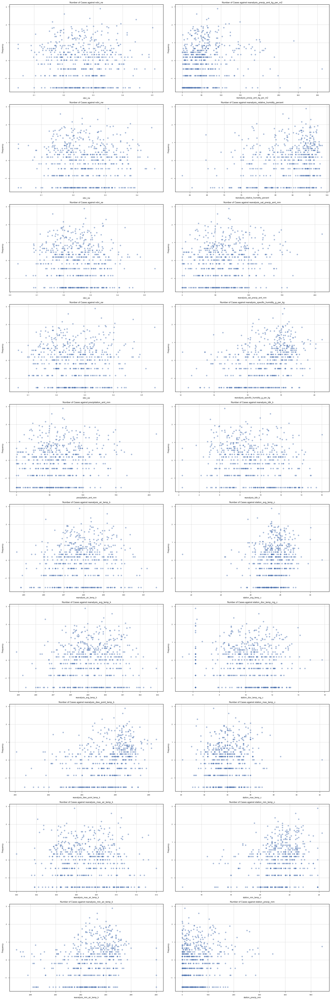

In [43]:
plot_scatter_feats(iq_X, iq_y)

#### Conclusion:

- __Seems like none of the features have a linear relationship with the number of dengue cases, so the first assumption for the use of Linear Regression (Multiple) doesn't hold__

---
<a id="normfeat"></a>

## 2. Normality of features

- Even though this isn't a requirement for linear regression models, it'll be a good check because we can use transformations like Yeo-Johnson (positive and negative values) / Box-Cox (Only positive values) / Log Transforms to normalize and reduce skewness of our features to tackle the problem of covariate shifting.

In [50]:
# Helper function to plot the kernel density 
# estimation plot of normal distribution overlayed
# on the distribution plot of the features
def plot_dist(X):
    rcParams['figure.figsize'] = 20, 60
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            dist_plot = sns.distplot(X[name], ax=ax[idx, 0], label=name)
            normal_dist = sns.kdeplot(np.random.normal(size=len(X[name])), ax=ax[idx, 0], label='Normal Distribution')
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Distribution of {}".format(name), color='k')
        else:
            dist_plot = sns.distplot(X[name], ax=ax[idx - (len(X.columns) // 2), 1], label=name)
            normal_dist = sns.kdeplot(np.random.normal(size=len(X[name])), ax=ax[idx - (len(X.columns) // 2), 1], label='Normal Distribution')
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Distribution of {}".format(name), color='k')

    plt.tight_layout()
    plt.show();

# Helper function to calculate the empirical cumulative 
# distribution function
def ecdf(x):
    xs = np.sort(x)
    ys = np.arange(1, len(xs) + 1) / float(len(xs))
    return xs, ys

# Helper function to plot the normal cdf overlayed on the
# empirical cdf of the feature
def plot_ecdf(X):
    rcParams['figure.figsize'] = 20, 60
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            normal_cdf_line = ax[idx, 0].scatter(X[name], stats.norm.cdf(X[name]), label='Normal CDF')
            ecdf_line = ax[idx, 0].plot(*ecdf(X[name]), label='ECDF')
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Distribution of {}".format(name), color='k')
        else:
            normal_cdf_line = ax[idx - (len(X.columns) // 2), 1].scatter(X[name], stats.norm.cdf(X[name]), label='Normal CDF')
            ecdf_line = ax[idx - (len(X.columns) // 2), 1].plot(*ecdf(X[name]), label='ECDF')
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Distribution of {}".format(name), color='k')

    plt.tight_layout()
    plt.show();

#### City sj: 
- __Let's plot the distribution of each of these independent vars (features) overlayed on a normal distribution too to see which of the features most similarly follow a normal distribution__

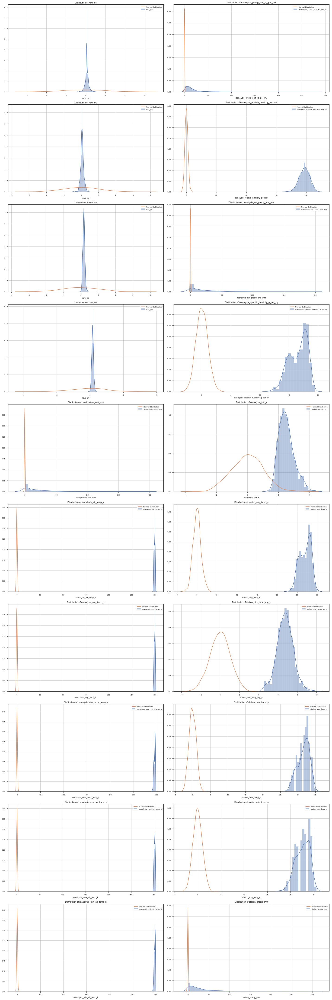

In [51]:
plot_dist(sj_X)

__Also, because we have more than 50 samples, we shall use the one-sample Kolmogorov-Smirnov Test for Normality instead of the Shapiro-Wilk Test for Normality__
- __Null Hypothesis: Sample is drawn from the Normal Distribution__

In [52]:
# Kolmogorov-Smirnov Test from scipy stats
sj_X_kstest = {}
for idx, name in enumerate(sj_X.columns):
    sj_X_kstest[name] = stats.kstest(sj_X[name], 'norm').pvalue
    print(name + ' p-value: ' + str(sj_X_kstest[name]))

ndvi_ne p-value: 6.444165324190709e-147
ndvi_nw p-value: 8.018407981845908e-162
ndvi_se p-value: 3.290057114065992e-229
ndvi_sw p-value: 6.5814645663652e-225
precipitation_amt_mm p-value: 0.0
reanalysis_air_temp_k p-value: 0.0
reanalysis_avg_temp_k p-value: 0.0
reanalysis_dew_point_temp_k p-value: 0.0
reanalysis_max_air_temp_k p-value: 0.0
reanalysis_min_air_temp_k p-value: 0.0
reanalysis_precip_amt_kg_per_m2 p-value: 0.0
reanalysis_relative_humidity_percent p-value: 0.0
reanalysis_sat_precip_amt_mm p-value: 0.0
reanalysis_specific_humidity_g_per_kg p-value: 0.0
reanalysis_tdtr_k p-value: 0.0
station_avg_temp_c p-value: 0.0
station_diur_temp_rng_c p-value: 0.0
station_max_temp_c p-value: 0.0
station_min_temp_c p-value: 0.0
station_precip_mm p-value: 0.0


__Plotting the ecdf of the feature and the normal distribution cdf__

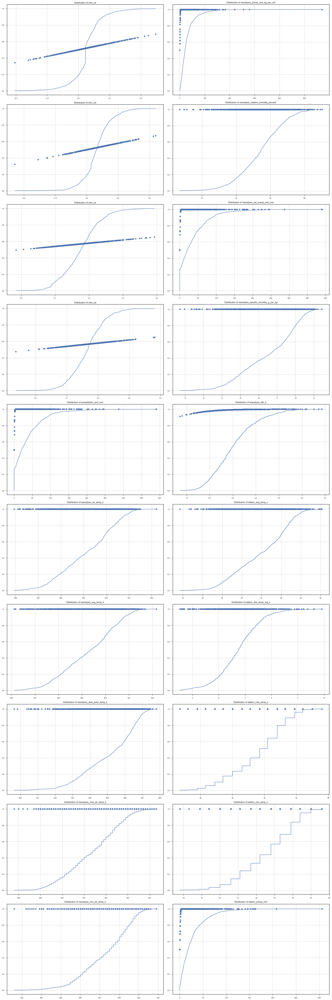

In [54]:
plot_ecdf(sj_X)

#### City iq: 
- __Let's plot the distribution of each of these independent vars (features) overlayed on a normal distribution too to see which of the features most similarly follow a normal distribution__

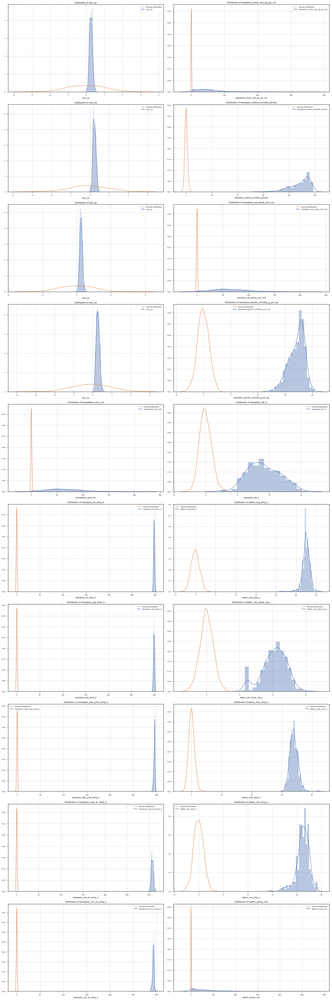

In [55]:
plot_dist(iq_X)

__Again, because we have more than 50 samples, we shall use the one-sample Kolmogorov-Smirnov Test for Normality instead of the Shapiro-Wilk Test for Normality__
- __Null Hypothesis: Sample is drawn from the Normal Distribution__

In [56]:
# Kolmogorov-Smirnov Test from scipy stats
iq_X_kstest = {}
for idx, name in enumerate(iq_X.columns):
    iq_X_kstest[name] = stats.kstest(iq_X[name], 'norm').pvalue
    print(name + ' p-value: ' + str(iq_X_kstest[name]))

ndvi_ne p-value: 1.391204576455867e-135
ndvi_nw p-value: 4.935150098784429e-131
ndvi_se p-value: 4.800097394750673e-137
ndvi_sw p-value: 1.397598704162834e-138
precipitation_amt_mm p-value: 0.0
reanalysis_air_temp_k p-value: 0.0
reanalysis_avg_temp_k p-value: 0.0
reanalysis_dew_point_temp_k p-value: 0.0
reanalysis_max_air_temp_k p-value: 0.0
reanalysis_min_air_temp_k p-value: 0.0
reanalysis_precip_amt_kg_per_m2 p-value: 0.0
reanalysis_relative_humidity_percent p-value: 0.0
reanalysis_sat_precip_amt_mm p-value: 0.0
reanalysis_specific_humidity_g_per_kg p-value: 0.0
reanalysis_tdtr_k p-value: 0.0
station_avg_temp_c p-value: 0.0
station_diur_temp_rng_c p-value: 0.0
station_max_temp_c p-value: 0.0
station_min_temp_c p-value: 0.0
station_precip_mm p-value: 0.0


__Plotting the ecdf of the feature and the normal distribution cdf__

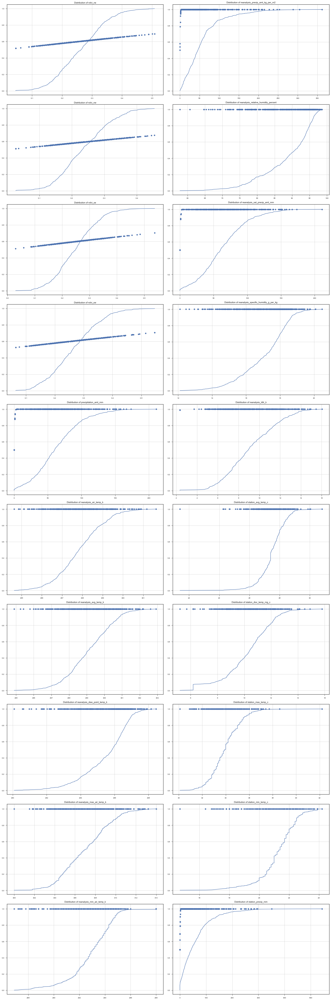

In [57]:
plot_ecdf(iq_X)

#### Conclusion:

- __Seems like none of our features are normally distributed, we would have to perform some transforms later on in the Feature Engineering section in order to improve the performances of our models__

---
<a id="multicol"></a>

## 3. Lack of Multicollinearity

In [137]:
# Helper function that plots a correlation matrix for 
# each pair of independent vars to ensure
# that no 2 features are too highly 
# correlated with each other
def correlation_matrix(X):
    axs = pd.plotting.scatter_matrix(X, figsize=(30, 30), diagonal='kde')
    n = len(X.columns)
    for x in range(n):
        for y in range(n):
            # to get the axis of subplots
            ax = axs[x, y]
            # to make x axis name vertical  
            ax.xaxis.label.set_rotation(90)
            # to make y axis name horizontal 
            ax.yaxis.label.set_rotation(0)
            # to make sure y axis names are outside the plot area
            ax.yaxis.labelpad = 50
    plt.show();

# We will use the variance inflation factor
# metric to determine which columns to drop
# Anything with VIF above 5.0 will be dropped
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Helper function to iteratively drop columns
# that have VIFs > 5.0
def calculate_vif(X, thresh=5.0):
    
        # Columns to be dropped
        dropped_cols = []
    
        # Taken from https://stats.stackexchange.com/a/253620/53565 and modified
        dropped=True
        while dropped:
            variables = X.columns
            dropped = False
            vif = [variance_inflation_factor(np.array(X), X.columns.get_loc(var)) for var in X.columns]
            
            # Get the highest VIF value
            max_vif = max(vif)
            
            # Drop the column with highest VIF value
            if max_vif > thresh:
                maxloc = vif.index(max_vif)
                dropped_cols.append(X.columns[maxloc])
                print(f'Dropping {X.columns[maxloc]} with vif={max_vif}')
                X = X.drop([X.columns.tolist()[maxloc]], axis=1)
                dropped=True
                
        return pd.DataFrame(X, index=X.index, columns=X.columns), dropped_cols

#### City sj: 
- __Multicollinearity checks__

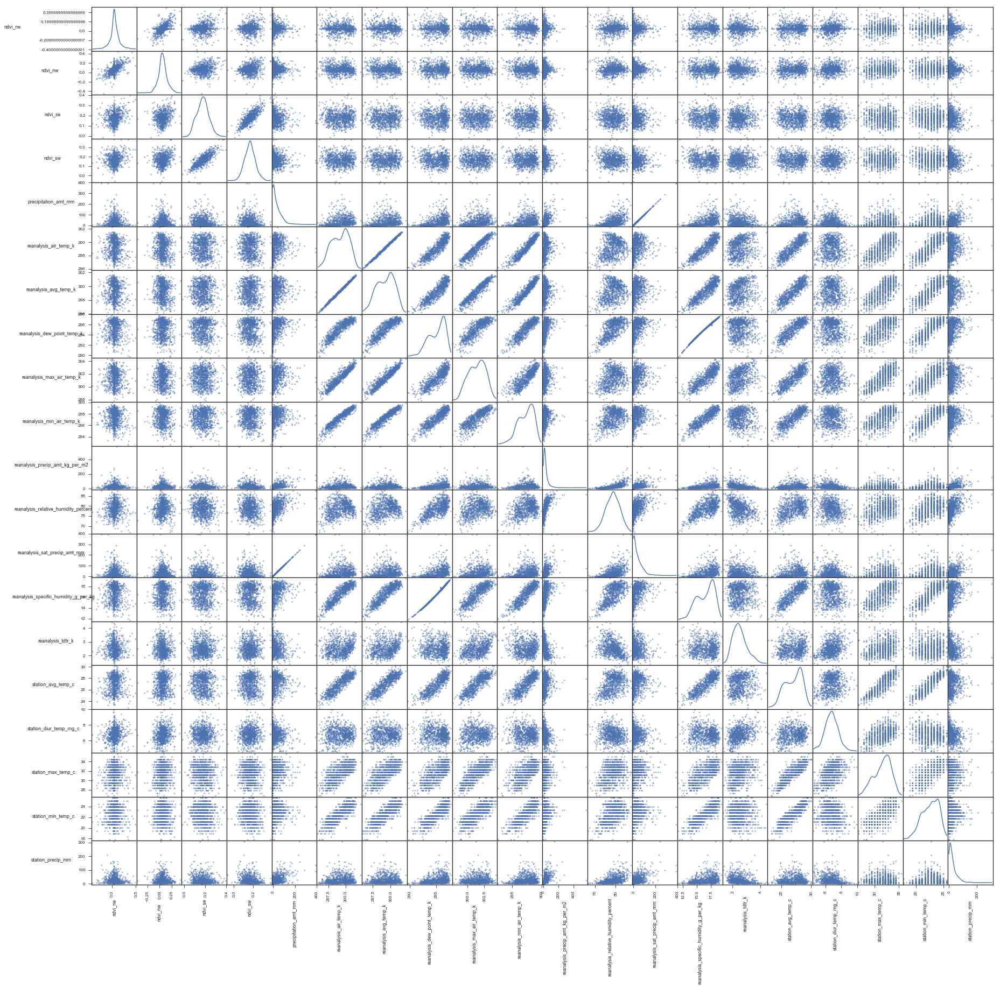

In [59]:
correlation_matrix(sj_X)

__There are definitely a number of features that are highly correlated and so we need to remove those for Linear Regression, let's take a look at the correlation matrix for City sj's data__

In [60]:
# Correlation matrix for City sj's data
sj_X.corr()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
ndvi_ne,1.000000,0.611061,0.204144,0.160510,-0.039551,-0.063952,-0.062322,-0.034695,-0.037749,-0.084744,0.005093,0.035057,-0.039551,-0.031195,-0.004793,0.058791,0.126759,0.079690,0.015922,-0.070517
ndvi_nw,0.611061,1.000000,0.203699,0.209359,-0.031111,-0.077111,-0.075962,-0.027575,-0.045942,-0.075725,0.008295,0.073228,-0.031111,-0.022876,-0.044089,0.080030,0.177679,0.124975,0.009846,-0.074033
ndvi_se,0.204144,0.203699,1.000000,0.800022,-0.107798,-0.017256,-0.014424,-0.066628,-0.009224,-0.048689,-0.125404,-0.116932,-0.107798,-0.062974,0.042065,-0.064756,0.008685,-0.079620,-0.075879,-0.133574
ndvi_sw,0.160510,0.209359,0.800022,1.000000,-0.117825,-0.043794,-0.036385,-0.087744,-0.015060,-0.072415,-0.125116,-0.117245,-0.117825,-0.080988,0.051879,-0.041236,0.070172,-0.017788,-0.074070,-0.172982
precipitation_amt_mm,-0.039551,-0.031111,-0.107798,-0.117825,1.000000,0.232449,0.220561,0.400364,0.256661,0.244826,0.510971,0.499257,1.000000,0.405957,-0.091373,0.196258,-0.154054,0.188603,0.221128,0.568559
reanalysis_air_temp_k,-0.063952,-0.077111,-0.017256,-0.043794,0.232449,1.000000,0.997496,0.903435,0.934956,0.942364,0.077371,0.298523,0.232449,0.905013,0.173619,0.880791,0.036733,0.698705,0.833196,0.109889
reanalysis_avg_temp_k,-0.062322,-0.075962,-0.014424,-0.036385,0.220561,0.997496,1.000000,0.895272,0.938752,0.939230,0.059390,0.284517,0.220561,0.896446,0.196604,0.878929,0.051095,0.704125,0.827554,0.093831
reanalysis_dew_point_temp_k,-0.034695,-0.027575,-0.066628,-0.087744,0.400364,0.903435,0.895272,1.000000,0.847312,0.898975,0.325861,0.678608,0.400364,0.998332,-0.036918,0.868923,-0.058712,0.690384,0.850172,0.281470
reanalysis_max_air_temp_k,-0.037749,-0.045942,-0.009224,-0.015060,0.256661,0.934956,0.938752,0.847312,1.000000,0.828538,0.089625,0.288231,0.256661,0.852958,0.349128,0.852609,0.111930,0.760855,0.770417,0.102656
reanalysis_min_air_temp_k,-0.084744,-0.075725,-0.048689,-0.072415,0.244826,0.942364,0.939230,0.898975,0.828538,1.000000,0.130047,0.385279,0.244826,0.896369,-0.053713,0.841624,-0.026271,0.627690,0.829668,0.147299


In [61]:
# Let's use statsmodel's api instead for linear regression
# as it'll provide us a better summary of the fit
sj_mods['OLS'] = sm.OLS(endog=sj_y_train, exog=sj_X_train).fit()

sj_y_preds['{}_y_pred'.format('OLS')] = sj_pwr.inverse_transform(sj_mods['OLS'].predict(sj_X_test)[:, None])
sj_mods['OLS'].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.170
Model:                            OLS   Adj. R-squared:                  0.144
Method:                 Least Squares   F-statistic:                     6.544
Date:                Thu, 21 Feb 2019   Prob (F-statistic):           1.09e-15
Time:                        23:56:48   Log-Likelihood:                -826.99
No. Observations:                 627   AIC:                             1692.
Df Residuals:                     608   BIC:                             1776.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
ndvi_ne                                   0.5845      0.490      1.193      0.233      -0.378       1.547
ndvi_nw                                   0.5400      0.527      1.024      0.306      -0.495       1.575
ndvi_se                                  -2.9661      1.084     -2.736      0.006      -5.095      -0.837
ndvi_sw                                   1.6052      1.135      1.414      0.158      -0.625       3.835
precipitation_amt_mm                     -0.0009      0.001     -1.597      0.111      -0.002       0.000
reanalysis_air_temp_k                     5.4901      1.797      3.055      0.002       1.961       9.019
reanalysis_avg_temp_k                    -0.5753      0.500     -1.152      0.250      -1.557       0.406
reanalysis_dew_point_temp_k              -5.6063      1.875     -2.990      0.003      -9.289      -1.924
reanalysis_max_air_temp_k                 0.2843      0.122      2.328      0.020       0.045       0.524
reanalysis_min_air_temp_k                 0.0440      0.129      0.341      0.734      -0.210       0.298
reanalysis_precip_amt_kg_per_m2           0.0026      0.002      1.250      0.212      -0.001       0.007
reanalysis_relative_humidity_percent      1.0384      0.376      2.764      0.006       0.301       1.776
reanalysis_sat_precip_amt_mm             -0.0009      0.001     -1.597      0.111      -0.002       0.000
reanalysis_specific_humidity_g_per_kg     0.7782      0.122      6.393      0.000       0.539       1.017
reanalysis_tdtr_k                        -0.5676      0.139     -4.089      0.000      -0.840      -0.295
station_avg_temp_c                       -0.4782      0.128     -3.723      0.000      -0.731      -0.226
station_diur_temp_rng_c                   0.2182      0.077      2.842      0.005       0.067       0.369
station_max_temp_c                        0.0428      0.062      0.688      0.492      -0.079       0.165
station_min_temp_c                        0.1212      0.082      1.469      0.142      -0.041       0.283
station_precip_mm                        -0.0034      0.002     -2.050      0.041      -0.007      -0.000
==============================================================================
Omnibus:                        0.496   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.780   Jarque-Bera (JB):                0.600
Skew:                          -0.034   Prob(JB):                        0.741
Kurtosis:                       2.865   Cond. No.                     6.26e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 7.34e-26. This might indicate that th

__From this, we can definitely conclude that there is a strong multicollinearity problem as an almost zero eigen value shows minimal variation in the data orthogonal with other eigen vectors. Hence, we will definitely need to remove some of those features later on in the Feature Engineering section.__

#### City iq:
- __Multicollinearity checks__

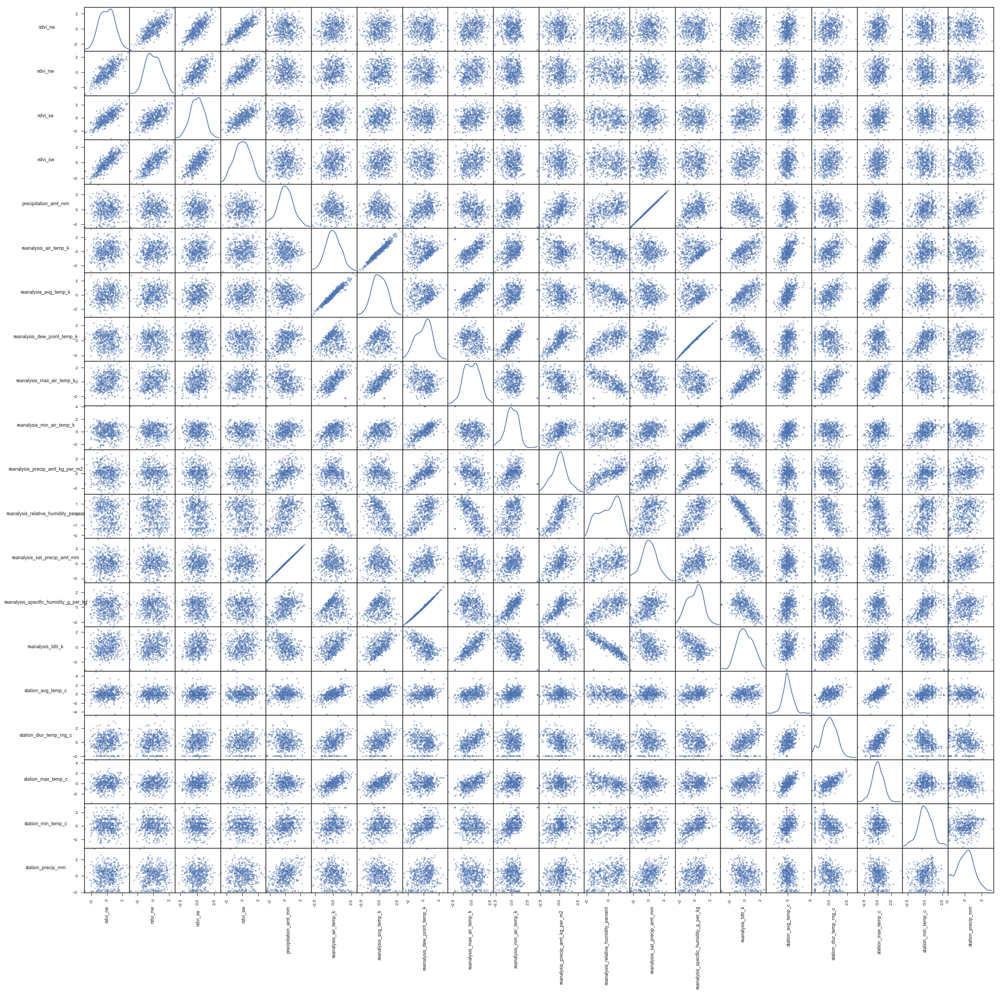

In [138]:
correlation_matrix(iq_X)

__There are definitely a number of features that are highly correlated and so we need to remove those for Linear Regression, let's take a look at the correlation matrix for City iq's data__

In [63]:
# Correlation matrix for City iq's data
iq_X.corr()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
ndvi_ne,1.000000,0.774034,0.774317,0.839890,0.014218,0.127790,0.158418,-0.037162,0.239496,-0.046257,-0.066471,-0.116273,0.014218,-0.038419,0.201657,0.109382,0.130617,0.153835,-0.032599,0.020981
ndvi_nw,0.774034,1.000000,0.654885,0.763458,-0.033660,0.129202,0.160483,-0.039842,0.229888,-0.037980,-0.060720,-0.116696,-0.033660,-0.037639,0.200341,0.121743,0.169618,0.168421,-0.108186,-0.009004
ndvi_se,0.774317,0.654885,1.000000,0.716587,-0.023394,0.177077,0.201097,-0.067431,0.278891,-0.055555,-0.109648,-0.176609,-0.023394,-0.066830,0.245867,0.113640,0.150521,0.172615,-0.072521,0.014644
ndvi_sw,0.839890,0.763458,0.716587,1.000000,-0.002726,0.146693,0.170130,-0.034068,0.243211,-0.026474,-0.053889,-0.127395,-0.002726,-0.031982,0.191847,0.110828,0.138694,0.182665,-0.068972,0.004591
precipitation_amt_mm,0.014218,-0.033660,-0.023394,-0.002726,1.000000,-0.071019,-0.062916,0.461964,-0.191111,0.268256,0.347904,0.441872,1.000000,0.456326,-0.325485,0.104711,-0.064426,0.011423,0.268507,0.379101
reanalysis_air_temp_k,0.127790,0.129202,0.177077,0.146693,-0.071019,1.000000,0.969564,0.152962,0.701653,0.433898,-0.096471,-0.555667,-0.071019,0.181193,0.494696,0.575891,0.396199,0.615369,0.261562,-0.145418
reanalysis_avg_temp_k,0.158418,0.160483,0.201097,0.170130,-0.062916,0.969564,1.000000,0.143436,0.756814,0.399067,-0.112285,-0.542291,-0.062916,0.167883,0.569072,0.551703,0.420398,0.606750,0.215982,-0.142035
reanalysis_dew_point_temp_k,-0.037162,-0.039842,-0.067431,-0.034068,0.461964,0.152962,0.143436,1.000000,-0.253297,0.734408,0.567774,0.733533,0.461964,0.997687,-0.596465,0.313601,-0.144900,0.086939,0.611714,0.184254
reanalysis_max_air_temp_k,0.239496,0.229888,0.278891,0.243211,-0.191111,0.701653,0.756814,-0.253297,1.000000,-0.093083,-0.236611,-0.685484,-0.191111,-0.238309,0.807493,0.359023,0.511604,0.587153,-0.129463,-0.175966
reanalysis_min_air_temp_k,-0.046257,-0.037980,-0.055555,-0.026474,0.268256,0.433898,0.399067,0.734408,-0.093083,1.000000,0.362474,0.316890,0.268256,0.741351,-0.438653,0.372890,-0.042654,0.183093,0.608160,0.066370


In [64]:
# Let's use statsmodel's api instead for linear regression
# as it'll provide us a better summary of the fit
iq_mods['OLS'] = sm.OLS(endog=iq_y_train, exog=iq_X_train).fit()

iq_y_preds['{}_y_pred'.format('OLS')] = iq_pwr.inverse_transform(iq_mods['OLS'].predict(iq_X_test)[:, None])
iq_mods['OLS'].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     3.462
Date:                Thu, 21 Feb 2019   Prob (F-statistic):           2.25e-06
Time:                        23:57:05   Log-Likelihood:                -461.29
No. Observations:                 348   AIC:                             960.6
Df Residuals:                     329   BIC:                             1034.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
ndvi_ne                                   0.4359      1.321      0.330      0.742      -2.163       3.035
ndvi_nw                                   0.2015      1.119      0.180      0.857      -2.000       2.403
ndvi_se                                  -0.7865      1.080     -0.728      0.467      -2.911       1.338
ndvi_sw                                  -0.1954      1.153     -0.169      0.866      -2.463       2.073
precipitation_amt_mm                     -0.0011      0.001     -1.312      0.190      -0.003       0.001
reanalysis_air_temp_k                     0.5016      0.496      1.011      0.313      -0.475       1.478
reanalysis_avg_temp_k                    -0.2188      0.250     -0.877      0.381      -0.710       0.272
reanalysis_dew_point_temp_k              -0.3052      0.523     -0.583      0.560      -1.334       0.724
reanalysis_max_air_temp_k                -0.0397      0.050     -0.797      0.426      -0.138       0.058
reanalysis_min_air_temp_k                 0.0196      0.070      0.281      0.779      -0.118       0.157
reanalysis_precip_amt_kg_per_m2          -0.0019      0.001     -1.362      0.174      -0.005       0.001
reanalysis_relative_humidity_percent      0.0521      0.108      0.484      0.629      -0.160       0.264
reanalysis_sat_precip_amt_mm             -0.0011      0.001     -1.312      0.190      -0.003       0.001
reanalysis_specific_humidity_g_per_kg     0.3692      0.085      4.338      0.000       0.202       0.537
reanalysis_tdtr_k                         0.0731      0.078      0.937      0.350      -0.080       0.227
station_avg_temp_c                        0.0021      0.087      0.024      0.981      -0.170       0.174
station_diur_temp_rng_c                  -0.0554      0.037     -1.483      0.139      -0.129       0.018
station_max_temp_c                        0.0387      0.062      0.623      0.534      -0.083       0.161
station_min_temp_c                        0.0255      0.062      0.410      0.682      -0.097       0.148
station_precip_mm                         0.0010      0.001      1.201      0.231      -0.001       0.003
==============================================================================
Omnibus:                        5.702   Durbin-Watson:                   2.083
Prob(Omnibus):                  0.058   Jarque-Bera (JB):                3.591
Skew:                           0.000   Prob(JB):                        0.166
Kurtosis:                       2.502   Cond. No.                     9.82e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.7e-26. This might indicate that the

__From this, we can definitely conclude that there is a strong multicollinearity problem as an almost zero eigen value shows minimal variation in the data orthogonal with other eigen vectors. Hence, we will definitely need to remove some of those features later on in the Feature Engineering section.__

#### Conclusion:
- __Seems like these feature groups have very high correlation > 0.7:__
- `ndvi_sw` and `ndvi_se`
- `reanalysis_air_temp_k` and `reanalysis_avg_temp_k` and `reanalysis_dew_point_temp_k` and `reanalysis_min_air_temp_k` and `reanalysis_specific_humidity_g_per_kg` and `station_avg_temp_c` and `	station_max_temp_c` and `station_min_temp_c`

---
<a id="homo"></a>

## 4. Homoscedasticity (Errors have similar variance and no trend with predicted values)

In [79]:
# Helper function to plot the residuals 
# of the Ordinary Least Squares Regression
# against each feature
def plot_residuals_feat(residuals, X):
    # Plot residuals
    rcParams['figure.figsize'] = 20, 60
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            ax[idx, 0].scatter(X[name], residuals)
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Residuals against {}".format(name), color='k')
            ax[idx, 0].set_ylabel("Residuals")
            ax[idx, 0].set_xlabel("{}".format(name))
        else:
            ax[idx - (len(X.columns) // 2), 1].scatter(X[name], residuals)
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Residuals against {}".format(name), color='k')
            ax[idx - (len(X.columns) // 2), 1].set_ylabel("Residuals")
            ax[idx - (len(X.columns) // 2), 1].set_xlabel("{}".format(name))

    plt.tight_layout()
    plt.show();
    
# Helper function to plot the residuals
# of the Ordinary Least Squares Regression
# against the label
def plot_residuals_label(residuals, y_preds):
    # Plot residuals
    rcParams['figure.figsize'] = 16, 8
    fig, ax = plt.subplots(1,2)

    ax[0].scatter(y_preds['OLS_y_pred'], residuals)
    ax[0].grid(True)
    ax[0].set_title("Residuals against {}".format('OLS_y_pred'), color='k')
    ax[0].set_ylabel("Residuals")
    ax[0].set_xlabel("{}".format('OLS_y_pred'))

    ax[1].hist(residuals)
    ax[1].grid(True)
    ax[1].set_title("Histogram of Residuals", color='k')
    ax[1].set_ylabel("Frequency of Residuals")
    ax[1].set_xlabel("{}".format('OLS_y_pred'))

    plt.tight_layout()
    plt.show();

- __City sj: Create Standardized residual plot against each one of the predictor variables__

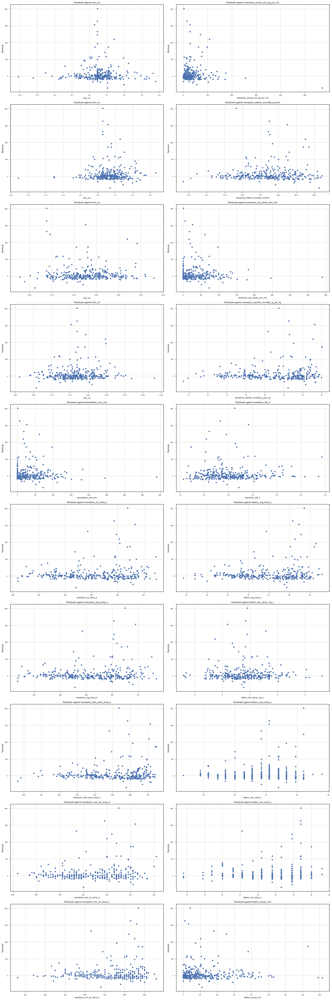

In [80]:
# Get the residuals for City sj's OLS prediction
sj_residuals = sj_y_test - sj_y_preds['OLS_y_pred']

plot_residuals_feat(sj_residuals, sj_X_test)

- __Let's also see the Residuals against predicted values plot and its Histogram__

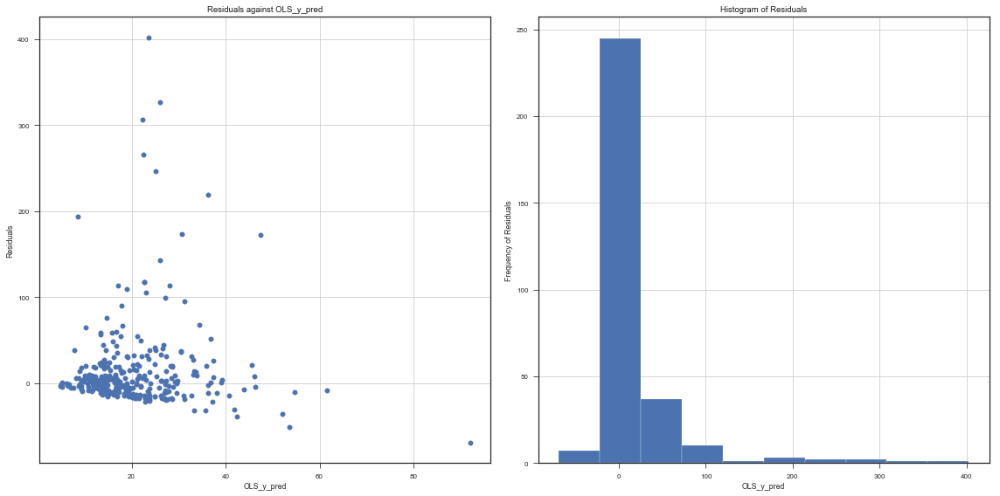

In [82]:
plot_residuals_label(sj_residuals, sj_y_preds)

__We'll now perform the Breusch Pagan test to check for heteroskedasticity__
- __Null Hypothesis: All observations have the same error variance, hence homoskedastic.__

In [83]:
# Can't find diagnostic
# _, sj_residuals_bp_pvalue, _, _ = statsmodels.stats.diagnostic.het_breuschpagan(sj_residuals)

- __City iq: Create Standardized residual plot against each one of the predictor variables__

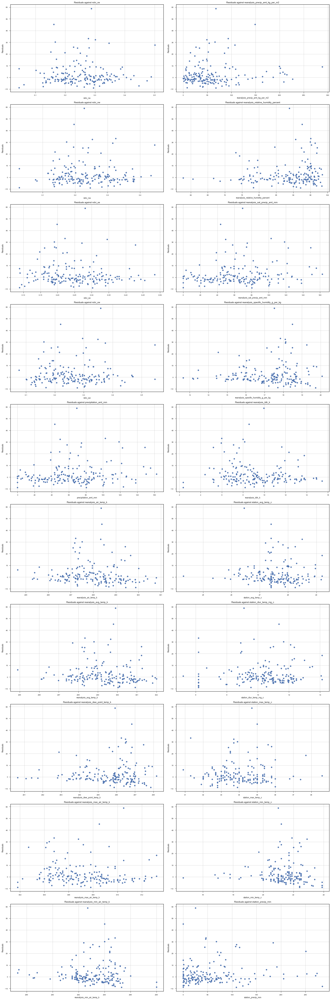

In [85]:
# Get the residuals for City iq's OLS prediction
iq_residuals = iq_y_test - iq_y_preds['OLS_y_pred']

plot_residuals_feat(iq_residuals, iq_X_test)

- __Let's also see the Residuals against predicted values plot and its Histogram__

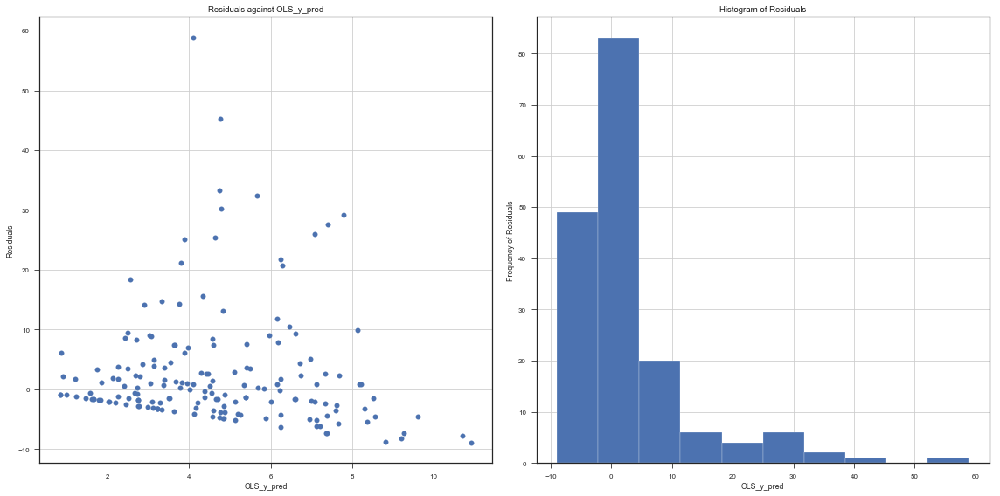

In [86]:
plot_residuals_label(iq_residuals, iq_y_preds)

__We'll now perform the Breusch Pagan test to check for heteroskedasticity__
- __Null Hypothesis: All observations have the same error variance, hence homoskedastic.__

In [87]:
# Can't find diagnostic
# _, iq_residuals_bp_pvalue, _, _ = statsmodels.stats.diagnostic.het_breuschpagan(iq_residuals)

#### Conclusion:
- 

---
<a id="normerr"></a>

## 5. Normality of errors

In [88]:
# Helper function to plot the distribution
# of residuals overlayed on the normal distribution
# to gauge if the errors are normally distributed
def plot_residuals_dist(residuals):
    rcParams['figure.figsize'] = 8, 8

    ax = sns.distplot(residuals)
    sns.kdeplot(np.random.normal(size=len(residuals)))
    ax.grid(True)
    ax.set_title("Distribution of {}".format('OLS Residuals'), color='k')

    plt.tight_layout()
    plt.show();

- __City sj Error distribution plot:__

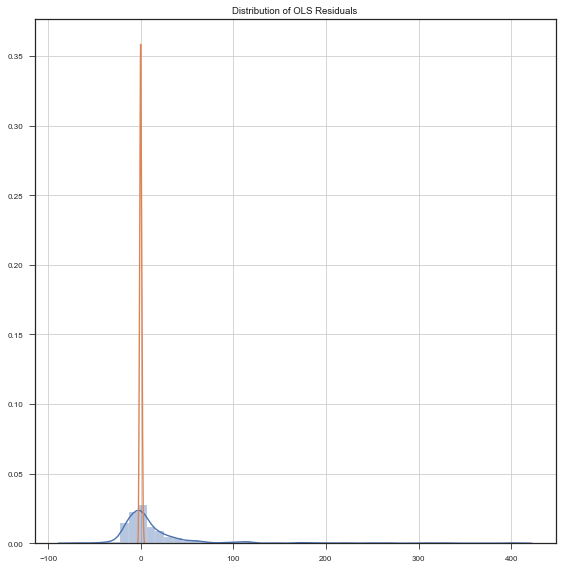

In [89]:
plot_residuals_dist(sj_residuals)

__Let's use the Jarque-Bera test (unreliable though, since we have less than 2000 data samples) to check whether the residuals are normally distributed__
- __Null Hypothesis: Joint hypothesis of the skewness being zero and the excess kurtosis being zero (Normally Distributed).__

In [90]:
_, sj_residuals_pvalue = stats.jarque_bera(sj_residuals)
print(sj_residuals_pvalue)

_, norm_residuals_pvalue = stats.jarque_bera(np.random.normal(size=len(sj_residuals)))
print(norm_residuals_pvalue)

0.0
0.3838951454504457


__Seems like our residuals are obviously not normally distributed, we'll have to feature engineer some new features in order to continue using linear regression__

- __City iq Error distribution plot:__

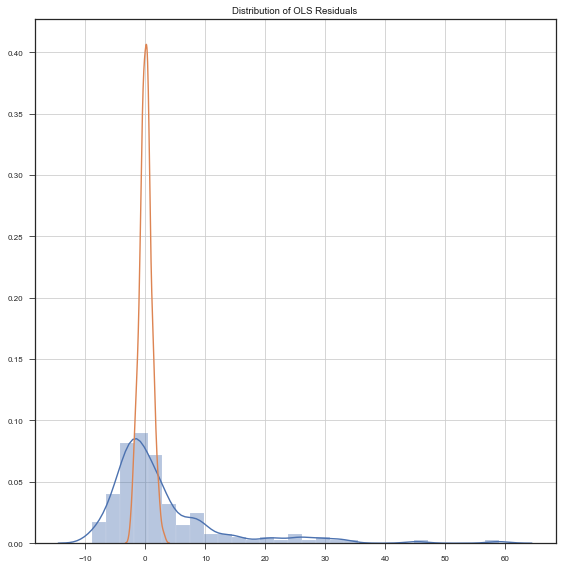

In [91]:
plot_residuals_dist(iq_residuals)

__Let's use the Jarque-Bera test (unreliable though, since we have less than 2000 data samples) to check whether the residuals are normally distributed__
- __Null Hypothesis: Joint hypothesis of the skewness being zero and the excess kurtosis being zero (Normally Distributed).__

In [92]:
_, iq_residuals_pvalue = stats.jarque_bera(iq_residuals)
print(iq_residuals_pvalue)

_, norm_residuals_pvalue = stats.jarque_bera(np.random.normal(size=len(iq_residuals)))
print(norm_residuals_pvalue)

0.0
0.4413757169499837


__Seems like our residuals are obviously not normally distributed, we'll have to feature engineer some new features in order to continue using linear regression__

---
<a id="autocorr"></a>

## 6. Autocorrelation

__Since we are on this topic of Autocorrelation, let's also try a fewtime series specific models to see if we can get any good predictions just from extarcting the underlying trends / seasonality of the total number of dengue cases since we have already seen previously from the distribution plots that there is some form on seasonality inside the distribution possibly arising from mosquito breeding in "wetter" periods of the year__

<a id="sarima"></a>

### Seasonal Autoregressive Integrated Moving Average 

__Let's first use the Hodrick–Prescott filter from statsmodels to separate the estimated cycle and trend from the `total_cases`__

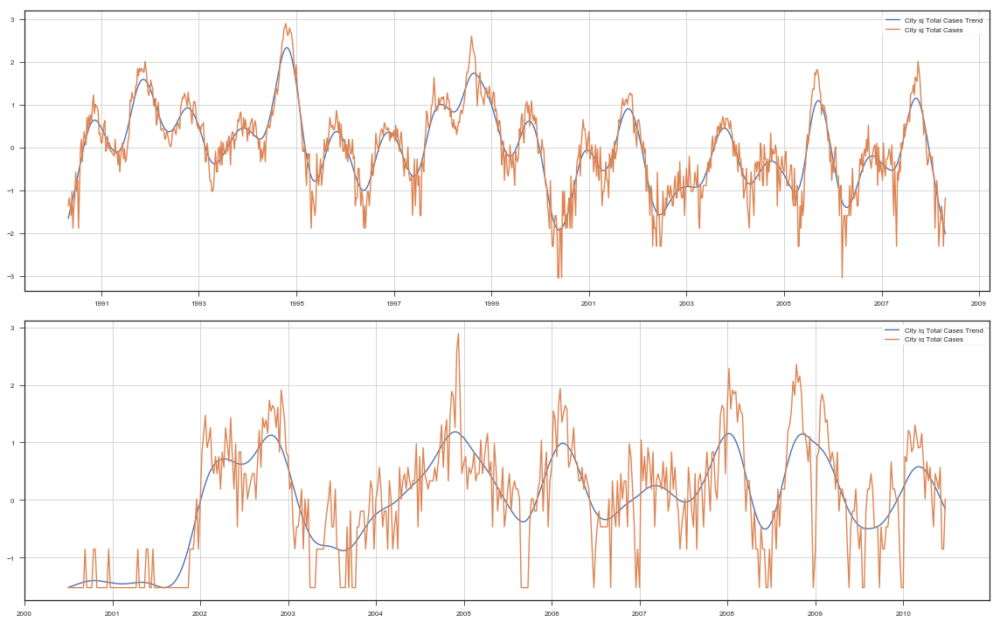

In [124]:
from statsmodels.api import tsa

sj_y_cycle, sj_y_trend = tsa.filters.hpfilter(sj_y)
iq_y_cycle, iq_y_trend = tsa.filters.hpfilter(iq_y)

rcParams['figure.figsize'] = 16, 10
fig, ax = plt.subplots(2,1)

# ax[0].plot(sj_y_cycle, label='City sj Total Cases Cycle')
ax[0].plot(sj_y_trend, label='City sj Total Cases Trend')
ax[0].plot(sj_y, label='City sj Total Cases')
ax[0].legend()
ax[0].grid(True)

# ax[1].plot(iq_y_cycle, label='City iq Total Cases Cycle')
ax[1].plot(iq_y_trend, label='City iq Total Cases Trend')
ax[1].plot(iq_y, label='City iq Total Cases')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show();

__Simple Moiving Averages: Let's create some moving averages as well__

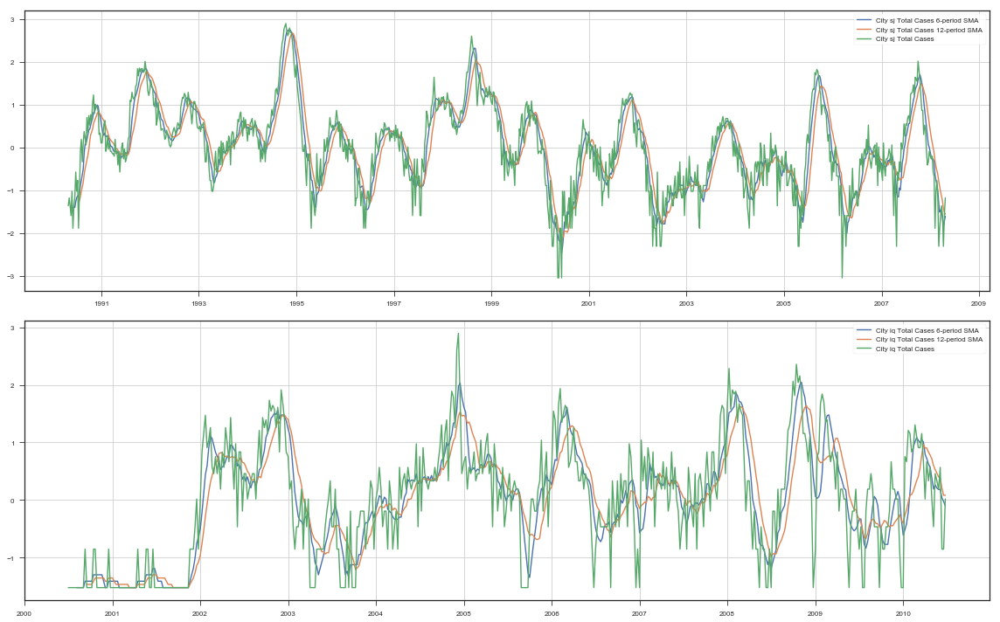

In [123]:
# 6 Period moving averages
sj_y_6_period_sma = sj_y.rolling(window=6).mean()
iq_y_6_period_sma = iq_y.rolling(window=6).mean()

# 12 Period moving averages
sj_y_12_period_sma = sj_y.rolling(window=12).mean()
iq_y_12_period_sma = iq_y.rolling(window=12).mean()

rcParams['figure.figsize'] = 16, 10
fig, ax = plt.subplots(2,1)

ax[0].plot(sj_y_6_period_sma, label='City sj Total Cases 6-period SMA')
ax[0].plot(sj_y_12_period_sma, label='City sj Total Cases 12-period SMA')
ax[0].plot(sj_y, label='City sj Total Cases')
ax[0].legend()
ax[0].grid(True)

ax[1].plot(iq_y_6_period_sma, label='City iq Total Cases 6-period SMA')
ax[1].plot(iq_y_12_period_sma, label='City iq Total Cases 12-period SMA')
ax[1].plot(iq_y, label='City iq Total Cases')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show();

__Exponentially Weighted Moving Averages: Since our plots don't reveal a consistent trend of the total number of dengue cases of both cities with time, we will not calculate any exponentially weighted moving averages.__

__Error, Trend, and Seasonality: Let's use statsmodel's `seasonal_decompose` api to see if there's other information with can still extract from the total number of cases__

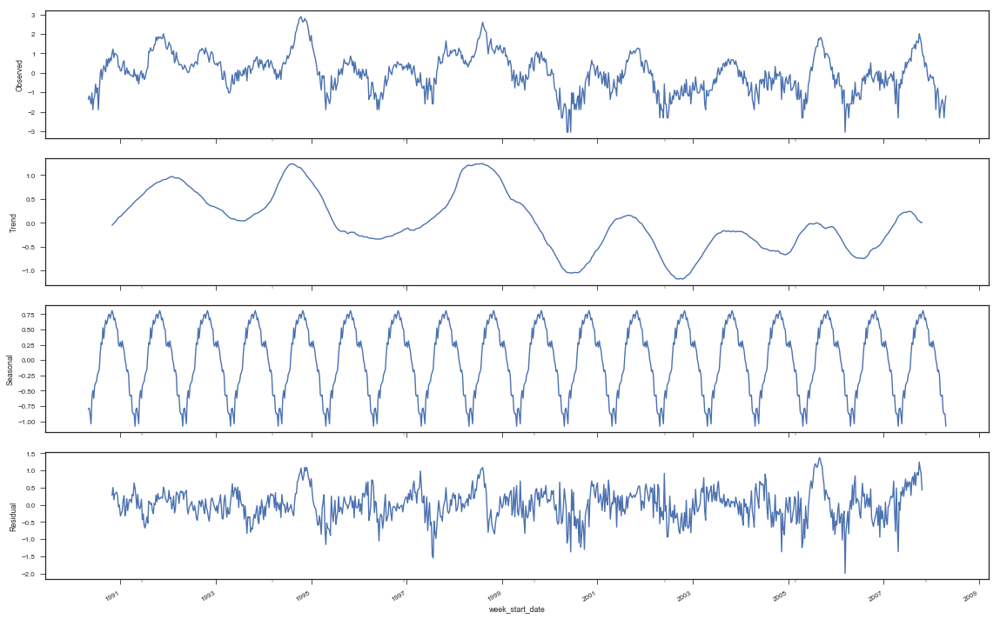

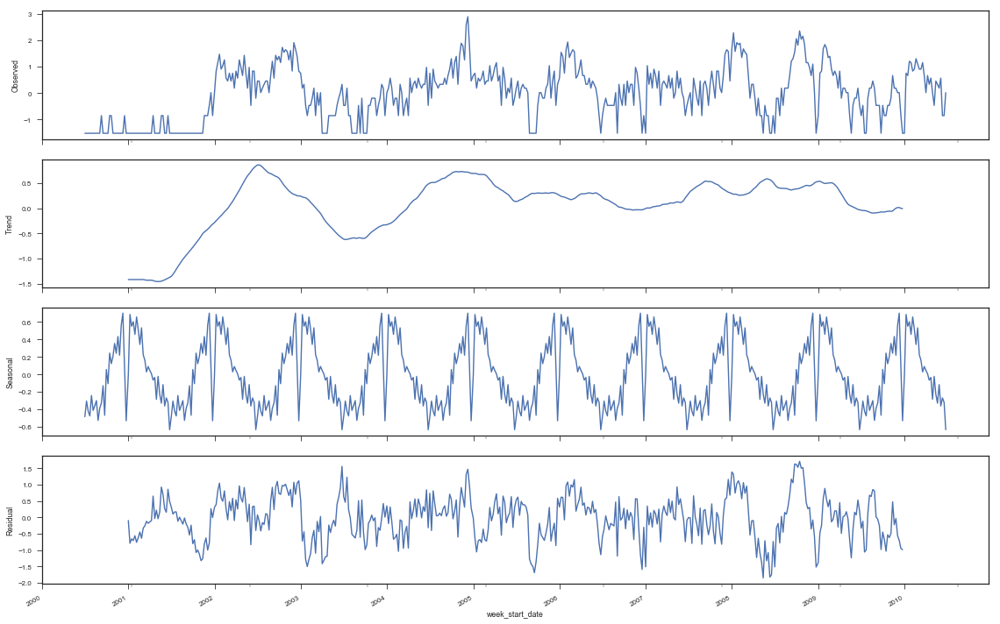

In [135]:
sj_ets = tsa.seasonal_decompose(sj_y, model='additive', freq=52).plot()
iq_ets = tsa.seasonal_decompose(iq_y, model='additive', freq=52).plot()

<a id="fft"></a>

### Fast Fourier Transform

In [ ]:
# TODO FFT

---
<a id="feateng"></a>

## Feature Engineering / Scaling

__Now that we have checked each raw feature for any violation of linear regression assumptions, let's feature engineer to perform [transformations](https://machinelearningmastery.com/machine-learning-data-transforms-for-time-series-forecasting/) to create new synthetic features that might help our models perform better.__

### 1. Power Transform (Make features normally distributed) / Log Transform (Reduce skewness)

__Yeo-Johnson Transform / Quantile Transform:__

In [96]:
from sklearn.preprocessing import power_transform

# Helper function to plot the power transformed
# versions of the features
def plot_pwr_dist(X):
    rcParams['figure.figsize'] = 20, 60
    fig, ax = plt.subplots(len(X.columns[2:]) // 2,2)

    for idx, name in enumerate(X.columns[2:]):
        if idx < len(X.columns[2:]) // 2:
            sns.distplot(X[name], ax=ax[idx, 0])
            sns.kdeplot(np.random.normal(size=len(X[name])), ax=ax[idx, 0])
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Distribution of Yeo-Johnson Transformed {}".format(name), color='k')
        else:
            sns.distplot(X[name], ax=ax[idx - (len(X.columns[2:]) // 2), 1])
            sns.kdeplot(np.random.normal(size=len(X[name])), ax=ax[idx - (len(X.columns[2:]) // 2), 1])
            ax[idx - (len(X.columns[2:]) // 2), 1].grid(True)
            ax[idx - (len(X.columns[2:]) // 2), 1].set_title("Distribution of Yeo-Johnson Transformed  {}".format(name), color='k')

    plt.tight_layout()
    plt.show();

- __City sj:__

In [97]:
# Applying yeo-johnson transform on the features of City sj 
sj_X = pd.DataFrame(power_transform(sj_X, method='yeo-johnson'), index=sj_X.index, columns=sj_X.columns)

/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:121: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:2743: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:122: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims)


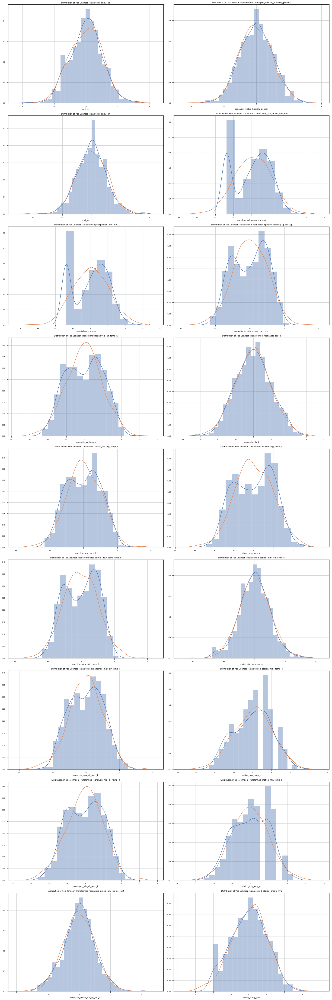

In [98]:
plot_pwr_dist(sj_X)

- __City iq:__

In [100]:
# Applying yeo-johnson transform on the features of City iq 
iq_X = pd.DataFrame(power_transform(iq_X, method='yeo-johnson'), index=iq_X.index, columns=iq_X.columns)

/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:121: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/Users/jeffchenchengyi/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:122: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims)


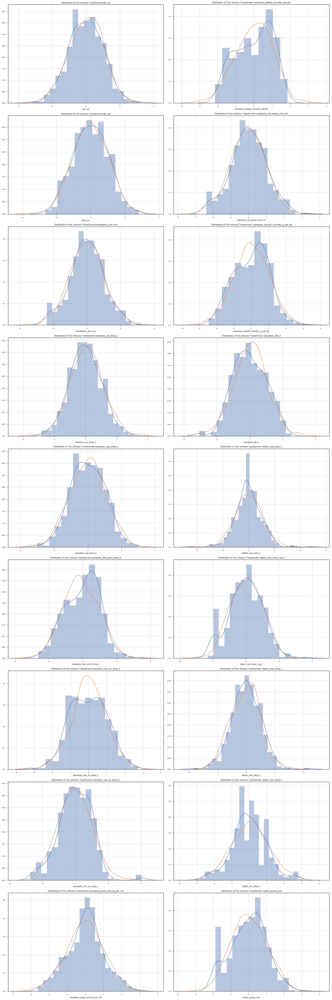

In [101]:
plot_pwr_dist(iq_X)

### 2. Seasonal Difference

### 3. Trend Difference

In [ ]:
# pca or lda here

---
<a id="featselect"></a>

## Feature Selection

__Before continuing to normalize and then standardize our data, let's squash our features to a lower dimensional space. This could be done using either Principal Component Analysis (PCA) or Linear Discriminant Analysis (LDA), but here we will use PCA.__

### Principal Component Analysis

In [ ]:
# We will perform PCA here using the original features,
# not the new feature set after removing features for
# multicollinearity using VIF
from sklearn import decomposition
all_pca = decomposition.PCA(n_components='mle')

# PCA on Both Cities features
all_X = all_pca.fit_transform(all_X)

sj_pca = decomposition.PCA(n_components='mle')

# PCA on City sj features
sj_X = sj_pca.fit_transform(sj_X)

iq_pca = decomposition.PCA(n_components='mle')

# PCA on City iq features
iq_X = iq_pca.fit_transform(iq_X)

In [ ]:
# let's print out some summary info of all_X, all_y, sj_X, iq_X and sj_y, iq_y
print("Both Cities features shape:", all_X.shape)
print("Both Cities target shape:", all_y.shape)

print("City sj features shape:", sj_X.shape)
print("City sj target shape:", sj_y.shape)

print("City iq features shape:", iq_X.shape)
print("City iq target shape:", iq_y.shape)

In [ ]:
# Train test split for this new feature set
sj_data_split = train_test_split(sj_X, sj_y, test_size=0.33, random_state=42)
sj_X_train, sj_X_test, sj_y_train, sj_y_test = sj_data_split

iq_data_split = train_test_split(iq_X, iq_y, test_size=0.33, random_state=42)
iq_X_train, iq_X_test, iq_y_train, iq_y_test = iq_data_split

### 4. Standardization

In [ ]:
# Let's try the models before standardizing the features
# Import standard scaler module
from sklearn.preprocessing import StandardScaler

# Scale Both Cities features
all_X_standard_scaler = StandardScaler()
all_X = pd.DataFrame(all_X_standard_scaler.fit_transform(all_X), index=all_X.index, columns=all_X.columns)

# Scale City sj features
sj_X_standard_scaler = StandardScaler()
sj_X = pd.DataFrame(sj_X_standard_scaler.fit_transform(sj_X), index=sj_X.index, columns=sj_X.columns)

# Scale City iq features
iq_X_standard_scaler = StandardScaler()
iq_X = pd.DataFrame(iq_X_standard_scaler.fit_transform(iq_X), index=iq_X.index, columns=iq_X.columns)

### 5. Normalization

In [ ]:
# Let's try the models before standardizing the features
# Import standard scaler module
from sklearn.preprocessing import MinMaxScaler

# Scale Both Cities features
all_X_normal_scaler = MinMaxScaler()
all_X = pd.DataFrame(all_X_normal_scaler.fit_transform(all_X), index=all_X.index, columns=all_X.columns)

# Scale City sj features
sj_X_normal_scaler = MinMaxScaler()
sj_X = pd.DataFrame(sj_X_normal_scaler.fit_transform(sj_X), index=sj_X.index, columns=sj_X.columns)

# Scale City iq features
iq_X_normal_scaler = MinMaxScaler()
iq_X = pd.DataFrame(iq_X_normal_scaler.fit_transform(iq_X), index=iq_X.index, columns=iq_X.columns)

In [ ]:
# let's print out some summary info of all_X, all_y, sj_X, iq_X and sj_y, iq_y
print("Both Cities features shape:", all_X.shape)
print("Both Cities target shape:", all_y.shape)

print("City sj features shape:", sj_X.shape)
print("City sj target shape:", sj_y.shape)

print("City iq features shape:", iq_X.shape)
print("City iq target shape:", iq_y.shape)

---
<a id="kernelridge"></a>

## Regression with Kernels and Regularization

__Seems like it'll be pretty hard to fit our data to a linear model given the number of linear regression assumptions that the data has violated. We could either continue to perform feature engineering on our dataset to create data that can perform under a linear model, or we can choose to focus on non-linear models instead. We shall go with the latter. However, let's just run the data through a KernelRidgeRegression model just to see what happens__

#### Hyper Parameter Tuning

__We have a few hyperparameters we will need to tune to adjust get the best performance out of our KernelRidge Regressor model and will use sklearn's GridSearchCV module to find the best set of hyperparameters to work with__

In [ ]:
# Import GridSearchCV
from sklearn.model_selection import GridSearchCV

# Import KernelRidgeRegression
from sklearn.kernel_ridge import KernelRidge

# Grid search parameters for KernelRidge
krr_hyperparams = [
    {
        'kernel': ['rbf'], 
        'alpha': [1e-1, 1e-2], 
        'gamma': [1e-1, 1e-2, 1e-3, 1e-4]
    },
    {
        'kernel': ['polynomial'],
        'degree': [2, 3], 
        'alpha': [1e-1, 1e-2]
    }
]

# Metrics 
metrics = {
    'MAE': 'neg_mean_absolute_error'
}

# Helper Function to run grid search 
# and store predictions 
def mod_with_grid_search(X_train, X_test, y_train, y_test, estimator, model_name, hyperparams, models, y_preds, city='sj', metrics=metrics):

    mod = GridSearchCV(estimator=estimator,
                       param_grid=hyperparams,
                       scoring=metrics,
                       cv=10,
                       refit='MAE',
                       n_jobs=-1,
                       return_train_score=True)

    mod.fit(X_train, y_train)
    models[model_name] = mod.best_estimator_

    print('City {}: '.format(city))
    print(mod.best_score_)
    y_preds['{}_y_pred'.format(model_name)] = models[model_name].predict(X_test)

# City sj
mod_with_grid_search(*sj_data_split, KernelRidge(), 'KernelRidge', krr_hyperparams, sj_mods, sj_y_preds, city='sj')

# City iq
mod_with_grid_search(*iq_data_split, KernelRidge(), 'KernelRidge', krr_hyperparams, iq_mods, iq_y_preds, city='iq')

<a id="dt"></a>

---
## Decision Tree with Grid Search

In [ ]:
# Grid search parameters for KernelRidge
tree_hyperparams = {
    'criterion': ['mse', 'mae'],
    'splitter': ['best', 'random'],
    'max_depth': range(2, 150, 5),
    'min_samples_split': range(2, 150, 5)
}

# City sj
mod_with_grid_search(*sj_data_split, sj_mods['DecisionTreeRegressor'], 'DecisionTreeRegressor', tree_hyperparams, sj_mods, sj_y_preds, city='sj')

# City iq
mod_with_grid_search(*iq_data_split, iq_mods['DecisionTreeRegressor'], 'DecisionTreeRegressor', tree_hyperparams, iq_mods, iq_y_preds, city='iq')

<a id="rf"></a>

---
## Random Forest with Grid Search

In [ ]:
# Grid search parameters for Random Forest
rf_hyperparams = {
    'n_estimators': [50, 100],
    'max_depth': range(2, 50, 5)
}

# City sj
mod_with_grid_search(*sj_data_split, sj_mods['RandomForestRegressor'], 'RandomForestRegressor', rf_hyperparams, sj_mods, sj_y_preds, city='sj')

# City iq
mod_with_grid_search(*iq_data_split, iq_mods['RandomForestRegressor'], 'RandomForestRegressor', rf_hyperparams, iq_mods, iq_y_preds, city='iq')

<a id="ada"></a>

---
## AdaBoost with Grid Search

In [ ]:
# Grid search parameters for AdaBoost
ada_hyperparams = {
    'n_estimators': [50, 100],
    'learning_rate': [1., 1e-1, 1e-2],
    'loss': ['linear', 'square', 'exponential']
}

# City sj
mod_with_grid_search(*sj_data_split, sj_mods['AdaBoostRegressor'], 'AdaBoostRegressor', ada_hyperparams, sj_mods, sj_y_preds, city='sj')

# City iq
mod_with_grid_search(*iq_data_split, iq_mods['AdaBoostRegressor'], 'AdaBoostRegressor', ada_hyperparams, iq_mods, iq_y_preds, city='iq')

<a id="gbtree"></a>

---
## GradientBoosted Tree with Grid Search

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Grid search parameters for Gradient Boosted Tree
gbtree_hyperparams = {
    'n_estimators': [50, 100], 
    'subsample': [0.5, 1], 
    'max_depth': [3, 5, 10]
}

# City sj
mod_with_grid_search(*sj_data_split, GradientBoostingRegressor(), 'GradientBoostingRegressor', gbtree_hyperparams, sj_mods, sj_y_preds, city='sj')

# City iq
mod_with_grid_search(*iq_data_split, GradientBoostingRegressor(), 'GradientBoostingRegressor', gbtree_hyperparams, iq_mods, iq_y_preds, city='iq')

<a id="svr"></a>

---
## Support Vector Regressor with Grid Search

In [ ]:
svr_hyperparams = [
    {
        'C': [1, 10, 100, 1000], 
        'kernel': ['linear']
    },
    {
        'C': [1, 10, 100, 1000], 
        'kernel': ['rbf'], 
        'gamma': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    }, 
    {
        'C': [1, 10, 100, 1000], 
        'kernel': ['sigmoid']
    }
]

# City sj
mod_with_grid_search(*sj_data_split, sj_mods['SVR'], 'SVR', svr_hyperparams, sj_mods, sj_y_preds, city='sj')

# City iq
mod_with_grid_search(*iq_data_split, iq_mods['SVR'], 'SVR', svr_hyperparams, iq_mods, iq_y_preds, city='iq')

<a id='mlp'></a>

---
## Multi-Layer Perception with Grid Search

In [ ]:
from sklearn.neural_network import MLPRegressor

mlp_hyperparams = [
    {
        "hidden_layer_sizes": [
            (1000,1000),
            (200, 200, 200),
            (100, 50, 25),
            (200, 100, 50, 25)
        ], 
        "nesterovs_momentum": [True, False]
    }
]

# City sj
mod_with_grid_search(*sj_data_split, MLPRegressor(early_stopping=True), 'MLPRegressor', mlp_hyperparams, sj_mods, sj_y_preds, city='sj')

# City iq
mod_with_grid_search(*iq_data_split, MLPRegressor(early_stopping=True), 'MLPRegressor', mlp_hyperparams, iq_mods, iq_y_preds, city='iq')

<a id='performance'></a>

---
## Machine Learning Model Performances

In [ ]:
# City sj regression testing scores
print_reg_scores(sj_y_preds, sj_pwr.inverse_transform(sj_y_test[:, None]), city='sj')

In [ ]:
# City iq regression testing scores
print_reg_scores(iq_y_preds, iq_pwr.inverse_transform(iq_y_test[:, None]), city='iq')

<a id='testing'></a>

---
## Testing Data for Competition

In [ ]:
# Read in testing data
raw_testing_features_df = pd.read_csv(DENGAI_PATH + '/test_features/dengue_features_test.csv', index_col='week_start_date')

In [ ]:
# 40% is arbitrary, you can use diff cut offs in cross validation step
bad_col_inds = (raw_testing_features_df.isna().sum() / raw_testing_features_df.shape[0]) > 0.4
raw_testing_features_df = raw_testing_features_df[raw_testing_features_df.columns[~bad_col_inds]]

In [ ]:
# Taking care of missing data
imputer = Imputer(missing_values = 'NaN', strategy = 'most_frequent')
imputer = imputer.fit(raw_testing_features_df.loc[:, raw_testing_features_df.isna().any()])
raw_testing_features_df.loc[:, raw_testing_features_df.isna().any()] = imputer.transform(raw_testing_features_df.loc[:, raw_testing_features_df.isna().any()])

In [ ]:
raw_testing_features_df.head(10)

__Let's split our data to one for city sj and one for city iq__

In [ ]:
features_testing_df = raw_testing_features_df.drop(['year', 'weekofyear'], axis=1)
sj_X_testing = features_testing_df[features_testing_df['city'] == 'sj'].drop(['city'], axis=1)
sj_X_testing.index = pd.to_datetime(sj_X_testing.index)

iq_X_testing = features_testing_df[features_testing_df['city'] == 'iq'].drop(['city'], axis=1)
iq_X_testing.index = pd.to_datetime(iq_X_testing.index)

__Standardizing the features__

In [ ]:
# Scale City sj features
sj_X_testing_scaler = StandardScaler()
sj_X_testing = pd.DataFrame(sj_X_testing_scaler.fit_transform(sj_X_testing), index=sj_X_testing.index, columns=sj_X_testing.columns)

# Scale City iq features
iq_X_testing_scaler = StandardScaler()
iq_X_testing = pd.DataFrame(iq_X_testing_scaler.fit_transform(iq_X_testing), index=iq_X_testing.index, columns=iq_X_testing.columns)

__Applying Yeo Johnson transform__

In [ ]:
# Applying yeo-johnson transform on the features of City sj 
sj_X_testing = pd.DataFrame(power_transform(sj_X_testing, method='yeo-johnson'), index=sj_X_testing.index, columns=sj_X_testing.columns)

# Applying yeo-johnson transform on the features of City iq 
iq_X_testing = pd.DataFrame(power_transform(iq_X_testing, method='yeo-johnson'), index=iq_X_testing.index, columns=iq_X_testing.columns)

__Adding Log features__

In [ ]:
# Add log features to City sj data
sj_X_testing = add_log_feats(sj_X_testing)

# Add log features to City iq data
iq_X_testing = add_log_feats(iq_X_testing)

__Applying PCA__

In [ ]:
sj_testing_pca = decomposition.PCA(n_components='mle')

# PCA on City sj features
sj_X_testing = sj_testing_pca.fit_transform(sj_X_testing)

iq_testing_pca = decomposition.PCA(n_components='mle')

# PCA on City iq features
iq_X_testing = iq_testing_pca.fit_transform(iq_X_testing)

__Running the trained models on the testing data__

In [ ]:
# TODO: Output test data predicted values to csv in format below
# testing_mods = {}

# # Adding City sj data first
# for name, mod in sj_mods.items():
#     testing_mods[name] = pd.DataFrame(columns=['city', 'year', 'weekofyear', 'total_cases'])
#     testing_mods[name] = testing_mods[name].append(, ignore_index=True)

# sj,2008,18,5

<a id="dnn"></a>

---
## Deep Neural Network

In [ ]:
# # Import Tensorflow library
# import tensorflow as tf

__City sj's model__

In [ ]:
# # Reset the default tensorflow graph
# tf.reset_default_graph()

# # Initialize the interactive session
# sj_sess = tf.InteractiveSession()

# # Get Feature Columns list for City sj 
# sj_feat_dict = {}
# for name in pd.DataFrame(sj_X).columns:
#     sj_feat_dict[name] = tf.feature_column.numeric_column(name)

# # Tensorflow input function for City sj
# sj_input_func = tf.estimator.inputs.pandas_input_fn(x=sj_X_train.reset_index(drop=True),
#                                                     y=sj_y_train.reset_index(drop=True), 
#                                                     batch_size=10,
#                                                     num_epochs=1000, 
#                                                     shuffle=True)

# # DNN Model for City sj
# sj_dnn_mod = tf.estimator.DNNRegressor(hidden_units=[10, 5, 5],
#                                        feature_columns=[feat_col for idx, feat_col in sj_feat_dict.items()])

# # Store dnn model in sj_mods
# sj_mods['DeepNeuralNetwork'] = sj_dnn_mod

In [ ]:
# # Train the model
# sj_dnn_mod.train(input_fn=sj_input_func, steps=25000);

In [ ]:
# # Create prediction input function for testing
# sj_predict_input_func = tf.estimator.inputs.pandas_input_fn(x=sj_X_test.reset_index(drop=True),
#                                                             batch_size=10,
#                                                             num_epochs=1,
#                                                             shuffle=False)

In [ ]:
# # Make prediction
# sj_y_preds['{}_y_pred'.format('DeepNeuralNetwork')] = [pred['predictions'] for pred in sj_dnn_mod.predict(sj_predict_input_func)]

In [ ]:
# # Print the R^2, MSE, and MAE scores for City sj dnn model predictions
# print('City sj DNN Model Prediction Metrics:')

# print('\nR^2 Scores:')
# print('{}: '.format('DeepNeuralNetwork Model:') + str(r2_score(sj_y_test, sj_y_preds['{}_y_pred'.format('DeepNeuralNetwork')])))

# print('\nMSE Scores:')
# print('{}: '.format('DeepNeuralNetwork Model:') + str(mean_squared_error(sj_y_test, sj_y_preds['{}_y_pred'.format('DeepNeuralNetwork')])))    

# print('\nMAE Scores:')
# print('{}: '.format('DeepNeuralNetwork Model:') + str(mean_absolute_error(sj_y_test, sj_y_preds['{}_y_pred'.format('DeepNeuralNetwork')])))

In [ ]:
# # Close the session
# sj_sess.close()

__City iq's model__

In [ ]:
# # Reset the default tensorflow graph
# tf.reset_default_graph()

# # Initialize the interactive session
# iq_sess = tf.InteractiveSession()

# # Get Feature Columns list for City iq 
# iq_feat_dict = {}
# for name in iq_X.columns:
#     iq_feat_dict[name] = tf.feature_column.numeric_column(name)

# # Tensorflow input function for City iq
# iq_input_func = tf.estimator.inputs.pandas_input_fn(x=iq_X_train.reset_index(drop=True),
#                                                     y=iq_y_train.reset_index(drop=True), 
#                                                     batch_size=10,
#                                                     num_epochs=1000, 
#                                                     shuffle=True)

# # DNN Model for City iq
# iq_dnn_mod = tf.estimator.DNNRegressor(hidden_units=[10, 5, 5],
#                                        feature_columns=[feat_col for idx, feat_col in iq_feat_dict.items()])

# # Store dnn model in iq_mods
# iq_mods['DeepNeuralNetwork'] = iq_dnn_mod

In [ ]:
# # Train the model
# iq_dnn_mod.train(input_fn=iq_input_func, steps=25000);

In [ ]:
# # Create prediction input function for testing
# iq_predict_input_func = tf.estimator.inputs.pandas_input_fn(x=iq_X_test.reset_index(drop=True),
#                                                             batch_size=10,
#                                                             num_epochs=1,
#                                                             shuffle=False)

In [ ]:
# # Make prediction
# iq_y_preds['{}_y_pred'.format('DeepNeuralNetwork')] = [pred['predictions'] for pred in iq_dnn_mod.predict(iq_predict_input_func)]

In [ ]:
# # Print the R^2, MSE, and MAE scores for City iq dnn model predictions
# print('City iq DNN Model Prediction Metrics:')

# print('\nR^2 Scores:')
# print('{}: '.format('DeepNeuralNetwork Model:') + str(r2_score(iq_y_test, iq_y_preds['{}_y_pred'.format('DeepNeuralNetwork')])))

# print('\nMSE Scores:')
# print('{}: '.format('DeepNeuralNetwork Model:') + str(mean_squared_error(iq_y_test, iq_y_preds['{}_y_pred'.format('DeepNeuralNetwork')])))    

# print('\nMAE Scores:')
# print('{}: '.format('DeepNeuralNetwork Model:') + str(mean_absolute_error(iq_y_test, iq_y_preds['{}_y_pred'.format('DeepNeuralNetwork')])))

In [ ]:
# # Close the session
# iq_sess.close()